${\Huge \text{Clinical Heme Panel Optimisation}}$ <br /><br />
${\Large \text{Papaemmanuil Lab | Pierre Guilmin}}$  
$\text{December 2018}$

Study of the unreported indels/substitutions in the pan-myeloid dataset in order to optimise the clinical heme pannel.
***

In [1]:
%matplotlib inline

In [2]:
# custom useful tool functions and base python modules
from utils.tools import *
set_jupyter_env()

# Get pan-myeloid data

In [3]:
data = pd.read_csv('data/raw/genetics_final.txt', sep='\t', low_memory=False)
print_size(data)
data.head()

Size: 27105 x 31


,ID,Gene,Chr,Begin,End,Ref,Obs,TotRead,VAF,TRANSCRIPT,RNA_CHANGE,CDNA_CHANGE,PROTEIN_CHANGE,CONSEQUENCE,type,Annotation,dataset,ID_VARIANT,PROTEIN_VARIANT,PROTEIN_POS,DISEASE,UNIQUE_VARIANT,mutation_type,hotspot,hotspot_type,variable,VAF.corr,LCI.corr,UCI.corr,correction,data_source
0,05-001144,DNMT3A,chr2,25468174.0,25468174.0,T,C,143.0,0.405594,CCDS33157.1,r.1840a>g,c.1502A>G,p.N501S,non_synonymous_codon,Sub,ONCOGENIC,MDS MLL Labs,2_25468174_T_C,DNMT3A_501,501.0,MDS,05-001144_chr2_25468174_T_C,missense,DNMT3A_other,DNMT3A_missense,DNMT3A,0.405594,0.328552,0.487674,None,CAVEMAN/PINDEL
1,05-001169,ETV6,chr12,12006445.0,12006447.0,ACT,A,1126.0,0.158082,CCDS8643.1,r.688_689delCU,c.414_415delCT,p.S139fs*14,frameshift_variant,Del,ONCOGENIC,MDS MLL Labs,12_12006445_ACT_A,ETV6_139,139.0,MDS,05-001169_chr12_12006445_ACT_A,nonsense,NaN,NaN,ETV6,0.158082,0.137957,0.180565,None,CAVEMAN/PINDEL
2,05-001169,U2AF1,chr21,44514777.0,44514777.0,T,G,368.0,0.258152,CCDS13694.1,r.563a>c,c.470A>C,p.Q157P,non_synonymous_codon,Sub,ONCOGENIC,MDS MLL Labs,21_44514777_T_G,U2AF1_157,157.0,MDS,05-001169_chr21_44514777_T_G,missense,U2AF1_p.Q157,NaN,U2AF1_p.Q157,0.258152,0.216125,0.305256,None,CAVEMAN/PINDEL
3,05-001264,ASXL1,chr20,31021250.0,31021250.0,C,T,495.0,0.424242,CCDS13201.1,r.1673c>u,c.1249C>T,p.R417*,stop_gained,Sub,ONCOGENIC,MDS MLL Labs,20_31021250_C_T,ASXL1_417,417.0,MDS,05-001264_chr20_31021250_C_T,nonsense,ASXL1_other,NaN,ASXL1,0.424242,0.381443,0.468227,None,CAVEMAN/PINDEL
4,05-001314,DNMT3A,chr2,25466779.0,25466779.0,C,T,469.0,0.076759,CCDS33157.1,r.2262g>a,c.1924G>A,p.G642R,non_synonymous_codon,Sub,ONCOGENIC,MDS MLL Labs,2_25466779_C_T,DNMT3A_642,642.0,MDS,05-001314_chr2_25466779_C_T,missense,DNMT3A_other,DNMT3A_missense,DNMT3A,0.076759,0.056032,0.104466,None,CAVEMAN/PINDEL


## Process data

### Dismiss some probable artefacts/germline calls

Following Elli's advices:

In [4]:
data['annotation_Pierre'] = 'oncogenic'
data.loc[data['Gene'] == 'HLA-B', 'annotation_Pierre'] = 'dismissed'
data.loc[(data['Gene'] == 'NPM1') & (data['mutation_type'] == 'inframe'), 'annotation_Pierre'] = 'dismissed'
get_table(data['annotation_Pierre'])

# remove them
data = data[data['annotation_Pierre'] != 'dismissed']

### Remove the ITDs, PTDs and complex mutations

In [5]:
get_table(data['type'])

,count_,freq_
Sub,17567,65.00%
Ins,4402,16.29%
Del,3494,12.93%
ITD,1062,3.93%
PTD,433,1.60%
Complex,70,0.26%


In [6]:
# remove the ITDs, PTDs and complex mutations
data = data[~data['type'].isin(['ITD', 'PTD', 'Complex'])]
print_size(data)

Size: 25515 x 32


In [7]:
get_table(data['type'])

,count_,freq_
Sub,17567,68.99%
Ins,4402,17.29%
Del,3494,13.72%


### [OLD] Apply low-quality filters

⚠️ we finally decided not to remove the low-quality calls, the following doesn't apply anymore:

> The rules given by Ryan are to filter the calls are:
> - depth $\geq$ 20
> - AD $\geq$ 8
> - VAF $\geq$ 0.02
> 
> ```python
> # compute the number of supporting read for each mutation
> data['read_count'] = data['VAF'] * data['TotRead']
> data[['VAF', 'TotRead', 'read_count']].head()
>
> # keep only the good quality calls
> data = data[(data['TotRead'] >= 20) &
>             (data['read_count'] >= 8) &
>             (data['VAF'] >= 0.02)]
> print_size(data)
> ```

### Remove the weird `CEBPA_bi` mutation

In [8]:
# remove the weird CEBPA_bi mutation
display(data[data['ID_VARIANT'] == 'CEBPA_bi'].head())
data = data[data['ID_VARIANT'] != 'CEBPA_bi']
print_size(data)

,ID,Gene,Chr,Begin,End,Ref,Obs,TotRead,VAF,TRANSCRIPT,RNA_CHANGE,CDNA_CHANGE,PROTEIN_CHANGE,CONSEQUENCE,type,Annotation,dataset,ID_VARIANT,PROTEIN_VARIANT,PROTEIN_POS,DISEASE,UNIQUE_VARIANT,mutation_type,hotspot,hotspot_type,variable,VAF.corr,LCI.corr,UCI.corr,correction,data_source,annotation_Pierre
26882,PD10796a,CEBPA,chr19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ONCOGENIC,AML AMLSG,CEBPA_bi,CEBPA_bi,NaN,AML,NaN,NaN,CEBPA_bi,NaN,CEBPA_bi,NaN,NaN,NaN,none,CEBPA clinical,oncogenic
26883,PD10809a,CEBPA,chr19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ONCOGENIC,AML AMLSG,CEBPA_bi,CEBPA_bi,NaN,AML,NaN,NaN,CEBPA_bi,NaN,CEBPA_bi,NaN,NaN,NaN,none,CEBPA clinical,oncogenic
26884,PD10815a,CEBPA,chr19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ONCOGENIC,AML AMLSG,CEBPA_bi,CEBPA_bi,NaN,AML,NaN,NaN,CEBPA_bi,NaN,CEBPA_bi,NaN,NaN,NaN,none,CEBPA clinical,oncogenic
26885,PD10818a,CEBPA,chr19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ONCOGENIC,AML AMLSG,CEBPA_bi,CEBPA_bi,NaN,AML,NaN,NaN,CEBPA_bi,NaN,CEBPA_bi,NaN,NaN,NaN,none,CEBPA clinical,oncogenic
26886,PD10830a,CEBPA,chr19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ONCOGENIC,AML AMLSG,CEBPA_bi,CEBPA_bi,NaN,AML,NaN,NaN,CEBPA_bi,NaN,CEBPA_bi,NaN,NaN,NaN,none,CEBPA clinical,oncogenic


Size: 25463 x 32


### Compute the `End` column for the data where it is `NA`

In [9]:
data.notnull().all()

ID                    True
Gene                  True
Chr                   True
Begin                 True
End                  False
Ref                   True
Obs                   True
TotRead              False
VAF                  False
TRANSCRIPT            True
RNA_CHANGE            True
CDNA_CHANGE           True
PROTEIN_CHANGE        True
CONSEQUENCE           True
type                  True
Annotation            True
dataset               True
ID_VARIANT            True
PROTEIN_VARIANT       True
PROTEIN_POS          False
DISEASE               True
UNIQUE_VARIANT       False
mutation_type         True
hotspot              False
hotspot_type         False
variable              True
VAF.corr             False
LCI.corr             False
UCI.corr             False
correction            True
data_source           True
annotation_Pierre     True
dtype: bool

In [10]:
print_size(data[data['End'].isnull()])
data[data['End'].isnull()].head()

Size: 3690 x 32


,ID,Gene,Chr,Begin,End,Ref,Obs,TotRead,VAF,TRANSCRIPT,RNA_CHANGE,CDNA_CHANGE,PROTEIN_CHANGE,CONSEQUENCE,type,Annotation,dataset,ID_VARIANT,PROTEIN_VARIANT,PROTEIN_POS,DISEASE,UNIQUE_VARIANT,mutation_type,hotspot,hotspot_type,variable,VAF.corr,LCI.corr,UCI.corr,correction,data_source,annotation_Pierre
9969,PD10085a2,CALR,chr19,13054564.0,NaN,AGCAGAGGCTTAAGGAGGAGGAAGAAGACAAGAAACGCAAAGAGGAGGAGGAG,A,133.0,0.59,CCDS12288.1,r.1165_1216del52,c.1092_1143del52,p.L367fs*46,frameshift_variant,Del,ONCOGENIC,MPN PT1 Trial,19_13054564_AGCAGAGGCTTAAGGAGGAGGAAGAAGACAAGAAACGCAAAGAGGAGGAGGAG_A,CALR_367,367.0,MPN,PD10085a2_chr19_13054564_AGCAGAGGCTTAAGGAGGAGGAAGAAGACAAGAAACGCAAAGAGGAGGAGGAG_A,nonsense,NaN,NaN,CALR,0.295,0.222573,0.375736,LOH,CAVEMAN/PINDEL,oncogenic
9970,PD10086a2,CALR,chr19,13054627.0,NaN,A,ATTGTC,286.0,0.34,CCDS12288.1,r.1227_1228insuuguc,c.1154_1155insTTGTC,p.K385fs*47,frameshift_variant,Ins,ONCOGENIC,MPN PT1 Trial,19_13054627_A_ATTGTC,CALR_385,385.0,MPN,PD10086a2_chr19_13054627_A_ATTGTC,nonsense,NaN,NaN,CALR,0.340,0.286751,0.395906,None,CAVEMAN/PINDEL,oncogenic
9971,PD10087a2,SETBP1,chr18,42531185.0,NaN,G,A,296.0,0.51,CCDS11923.2,r.2176g>a,c.1880G>A,p.R627H,non_synonymous_codon,Sub,ONCOGENIC,MPN PT1 Trial,18_42531185_G_A,SETBP1_627,627.0,MPN,PD10087a2_chr18_42531185_G_A,missense,NaN,NaN,SETBP1,0.510,0.453381,0.566625,None,CAVEMAN/PINDEL,oncogenic
9972,PD10087a2,CALR,chr19,13054564.0,NaN,AGCAGAGGCTTAAGGAGGAGGAAGAAGACAAGAAACGCAAAGAGGAGGAGGAG,A,101.0,0.46,CCDS12288.1,r.1165_1216del52,c.1092_1143del52,p.L367fs*46,frameshift_variant,Del,ONCOGENIC,MPN PT1 Trial,19_13054564_AGCAGAGGCTTAAGGAGGAGGAAGAAGACAAGAAACGCAAAGAGGAGGAGGAG_A,CALR_367,367.0,MPN,PD10087a2_chr19_13054564_AGCAGAGGCTTAAGGAGGAGGAAGAAGACAAGAAACGCAAAGAGGAGGAGGAG_A,nonsense,NaN,NaN,CALR,0.460,0.361589,0.552640,None,CAVEMAN/PINDEL,oncogenic
9973,PD10088a2,CALR,chr19,13054627.0,NaN,A,ATTGTC,260.0,0.23,CCDS12288.1,r.1227_1228insuuguc,c.1154_1155insTTGTC,p.K385fs*47,frameshift_variant,Ins,ONCOGENIC,MPN PT1 Trial,19_13054627_A_ATTGTC,CALR_385,385.0,MPN,PD10088a2_chr19_13054627_A_ATTGTC,nonsense,NaN,NaN,CALR,0.230,0.183746,0.285765,None,CAVEMAN/PINDEL,oncogenic


The null `End` values come from 3 datasets:

In [11]:
# get number of null End values for each dataset
dd = get_table(data['dataset'])
dd['null_End'] = data.groupby('dataset')['End'].apply(lambda x: x.isnull().sum())
dd

,count_,freq_,null_End
AML MRC,6910,27.14%,0
AML AMLSG,3526,13.85%,0
MDS UK Leeds,3348,13.15%,0
AML UK Leeds,3157,12.40%,0
MDS MLL Labs,2665,10.47%,0
MPN PT1 Trial,2241,8.80%,2241
MDS ICGC,1387,5.45%,0
MPN Florence,821,3.22%,821
MDS IWG,780,3.06%,0
MPN UK,628,2.47%,628


In [12]:
# create the is_sub mask: data[is_sub] contains all the sub mutations, data[~is_sub] contains all the indels
is_sub = (data['type'] == 'Sub')

In [13]:
# compute the End value when it's missing for Sub, Ins and Del separately
null_End_Sub = data['End'].isnull() & is_sub
null_End_Ins = data['End'].isnull() & (data['type'] == 'Ins')
null_End_Del = data['End'].isnull() & (data['type'] == 'Del')

data.loc[null_End_Sub, 'End'] = data.loc[null_End_Sub, 'Begin']
data.loc[null_End_Ins, 'End'] = data.loc[null_End_Ins, 'Begin'] + 1
data.loc[null_End_Del, 'End'] = data.loc[null_End_Del, 'Begin'] + data.loc[null_End_Del, 'Ref'].str.len() - 1

### Compute a `short_consequence` column

In [14]:
get_table(data['CONSEQUENCE'])

,count_,freq_
non_synonymous_codon,14009,55.02%
frameshift_variant,6651,26.12%
stop_gained,2798,10.99%
transcript_variant,628,2.47%
inframe_codon_loss,469,1.84%
splice_site_variant,390,1.53%
inframe_codon_gain,384,1.51%
indel,83,0.33%
complex_change_in_transcript,16,0.06%
initiator_codon_change,12,0.05%


In [15]:
def get_short_consequence(consequence):
    if consequence == 'non_synonymous_codon':
        return 'missense'
    elif consequence in ['stop_gained', 'splice_site_variant']:
        return 'nonsense/splicing'
    elif consequence == 'frameshift_variant':
        return 'truncating'
    elif consequence in ['inframe_codon_loss', 'inframe_codon_gain']:
        return 'inframe'
    else:
        return 'other'

data['short_consequence'] = data['CONSEQUENCE'].apply(get_short_consequence)
get_table(data['short_consequence'])

,count_,freq_
missense,14009,55.02%
truncating,6651,26.12%
nonsense/splicing,3188,12.52%
inframe,853,3.35%
other,762,2.99%


## Print various basic information

In [16]:
data['ID'].nunique() # number of patients

8966

In [17]:
get_table(data['Annotation'])

,count_,freq_
ONCOGENIC,25463,100.00%


In [18]:
dd = get_table(data['DISEASE'])
dd['patient'] = data.groupby('DISEASE')['ID'].agg(lambda x: x.nunique())
dd

,count_,freq_,patient
AML,13656,53.63%,4348
MDS,8179,32.12%,2586
MPN,3628,14.25%,2063


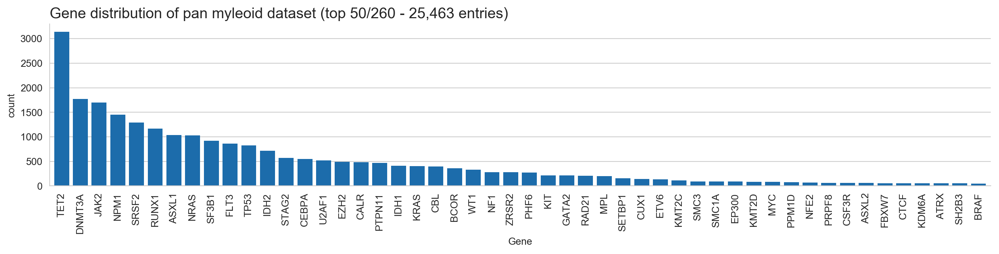

In [19]:
plot_categorical_feature(data, 'Gene', data_name='pan myleoid dataset', save_figure=True, figure_path='report/figures/fig1.png')

# Get transcripts data

In [20]:
# get transcripts list
transcripts_info = pd.read_csv('data/raw/refFlat.canonical_all_coding_exons_aa.interval_list', sep='\t', low_memory=False, header=None)
transcripts_info.columns = ['chromosome', 'start_position', 'end_position', 'strand_sign', 'info']
print_size(transcripts_info)
transcripts_info.head()

Size: 184235 x 5


,chromosome,start_position,end_position,strand_sign,info
0,1,69091,70008,+,OR4F5:NM_001005484:exon1:1-918:1-306
1,1,367659,368597,+,OR4F16:NM_001005277:exon1:1-939:1-313
2,1,861322,861393,+,SAMD11:NM_152486:exon2:1-72:1-24
3,1,865535,865716,+,SAMD11:NM_152486:exon3:73-254:25-85
4,1,866419,866469,+,SAMD11:NM_152486:exon4:255-305:85-102


In [21]:
transcripts_info[['Gene', 'TranscriptID', 'Exon', 'cDNA_position', 'AA_position']] = transcripts_info['info'].str.split(':', expand=True)
transcripts_info['exon_number'] = transcripts_info['Exon'].str[4:].astype(int)
transcripts_info[['cDNA_start', 'cDNA_end']] = transcripts_info['cDNA_position'].str.split('-', expand=True).astype(int)
transcripts_info[['AA_start', 'AA_end']]     = transcripts_info['AA_position']  .str.split('-', expand=True).astype(int)
transcripts_info.head()

,chromosome,start_position,end_position,strand_sign,info,Gene,TranscriptID,Exon,cDNA_position,AA_position,exon_number,cDNA_start,cDNA_end,AA_start,AA_end
0,1,69091,70008,+,OR4F5:NM_001005484:exon1:1-918:1-306,OR4F5,NM_001005484,exon1,1-918,1-306,1,1,918,1,306
1,1,367659,368597,+,OR4F16:NM_001005277:exon1:1-939:1-313,OR4F16,NM_001005277,exon1,1-939,1-313,1,1,939,1,313
2,1,861322,861393,+,SAMD11:NM_152486:exon2:1-72:1-24,SAMD11,NM_152486,exon2,1-72,1-24,2,1,72,1,24
3,1,865535,865716,+,SAMD11:NM_152486:exon3:73-254:25-85,SAMD11,NM_152486,exon3,73-254,25-85,3,73,254,25,85
4,1,866419,866469,+,SAMD11:NM_152486:exon4:255-305:85-102,SAMD11,NM_152486,exon4,255-305,85-102,4,255,305,85,102


# Unreported indels

## Get `clinical_exons.txt`

In [22]:
# get selected exons list
selected_exons = pd.read_csv('data/raw/clinical_exons.txt', sep='\t', low_memory=False)
print_size(selected_exons)
selected_exons.head()

Size: 68 x 2


,Gene,Exon
0,ASXL1,exon12
1,DNMT3A,exon2
2,DNMT3A,exon3
3,DNMT3A,exon4
4,DNMT3A,exon5


In [23]:
# check if we have transcript info for all selected exons
all(selected_exons['Gene'].isin(transcripts_info['Gene']))

True

In [24]:
# left join selected_exons with transcripts_info to get the position information for the selected exons in the transcript used
selected_exons = pd.merge(selected_exons, transcripts_info[['Gene', 'Exon', 'start_position', 'end_position']], how='left', left_on=['Gene', 'Exon'], right_on=['Gene', 'Exon'])
print_size(selected_exons)
selected_exons.head()

Size: 68 x 4


,Gene,Exon,start_position,end_position
0,ASXL1,exon12,31022235,31025141
1,DNMT3A,exon2,25536782,25536853
2,DNMT3A,exon3,25523008,25523112
3,DNMT3A,exon4,25505310,25505580
4,DNMT3A,exon5,25498369,25498412


## Find unreported indels

In [25]:
def get_indel_status(mutation):
    """
    Return a string describing the indel status between: 'not_in_exons_gene_panel', 'in_exons_gene_panel_but_not_in_exons_list' or 'in_exons_list'
    → Arguments:
        - mutation: a pan-myeloid dataset row
    """
    if not mutation['Gene'] in selected_exons['Gene'].values:
        return 'not_in_exons_gene_panel'
    
    # check if the beginning OR the end of the indel is within a selected exon
    corresponding_exon = selected_exons[(selected_exons['Gene'] == mutation['Gene']) &
                                        (
                                            ((mutation['Begin'] >= selected_exons ['start_position']) &
                                             (mutation['Begin'] <=  selected_exons['end_position']))
                                         |
                                            ((mutation['End']   >= selected_exons ['start_position']) &
                                             (mutation['End']   <=  selected_exons['end_position']))
                                        )]

    if corresponding_exon.shape[0] == 0:
        # no corresponding exon found
        return 'in_exons_gene_panel_but_not_in_exons_list'
    else:
        return 'in_exons_list'

In [26]:
data['status'] = 'unknown'
data.loc[~is_sub, 'status'] = data.loc[~is_sub].apply(get_indel_status, axis=1)
get_table(data.loc[~is_sub, 'status'])

,count_,freq_
in_exons_list,5267,66.70%
not_in_exons_gene_panel,2481,31.42%
in_exons_gene_panel_but_not_in_exons_list,148,1.87%


In [27]:
unreported_exons_genes = data.loc[~is_sub & (data['status'] == 'not_in_exons_gene_panel')].copy()

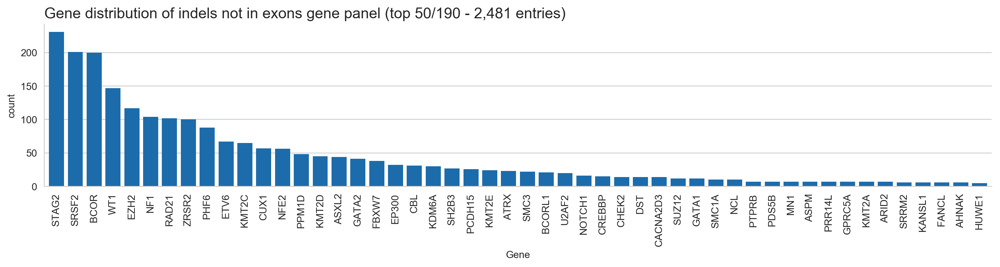

In [28]:
plot_categorical_feature(unreported_exons_genes, 'Gene', data_name='indels not in exons gene panel',
                         save_figure=True, figure_path='report/figures/fig2.png')

In [29]:
unreported_exons = data.loc[~is_sub & (data['status'] == 'in_exons_gene_panel_but_not_in_exons_list')].copy()

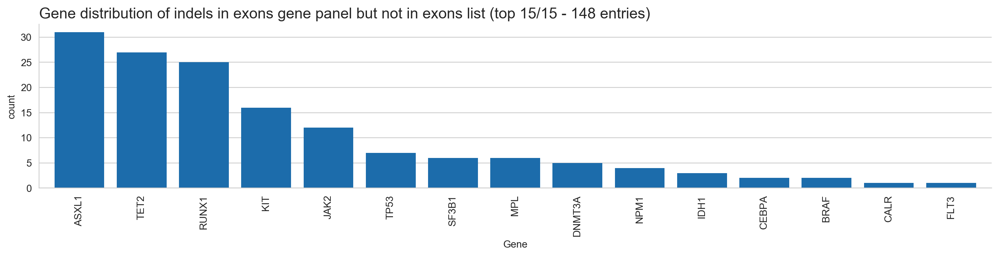

In [30]:
plot_categorical_feature(unreported_exons, 'Gene', data_name='indels in exons gene panel but not in exons list',
                         save_figure=True, figure_path='report/figures/fig3.png')

Let's get the unreported exon numbers:

In [31]:
def get_exon_number(mutation):
    """
    Return the exon number of a mutation in the transcripts_info list, or 'not_in_transcript_genes'/'not_in_transcript_exons' if the gene/exon was not found in the transcript list
    → Arguments:
        - mutation: a pan-myeloid dataset row
    """
    if not mutation['Gene'] in transcripts_info['Gene'].values:
        return 'not_in_transcript_genes'
    
    # check if the beginning OR the end of the indel is within a selected exon
    exons = transcripts_info[(transcripts_info['Gene'] == mutation['Gene']) &
                             (
                                 ((mutation['Begin'] >= transcripts_info ['start_position']) &
                                  (mutation['Begin'] <=  transcripts_info['end_position']))
                              |
                                 ((mutation['End']   >= transcripts_info ['start_position']) &
                                  (mutation['End']   <=  transcripts_info['end_position']))
                             )]
    
    if len(exons) == 0:
        return 'not_in_transcript_exons'
    elif len(exons) == 1:
        return exons['Exon'].values[0]
    else:
        # if the mutation belongs to two different exons we raise an error
        raise NameError('ERROR: two corresponding exons found')

unreported_exons['unreported_exons'] = unreported_exons.apply(get_exon_number, axis=1)
unreported_exons['unreported_exons'].head(10)

118                      exon16
154                      exon11
540                      exon11
706                      exon16
753                      exon11
757                       exon3
869                      exon11
1155    not_in_transcript_exons
1182    not_in_transcript_exons
1249                     exon11
Name: unreported_exons, dtype: object

In [32]:
unreported_exons.groupby('Gene').apply(lambda x: pd.Series({'unreported exons': dict(x['unreported_exons'].value_counts())}))

,unreported exons
Gene,
ASXL1,"{'exon11': 30, 'not_in_transcript_exons': 1}"
BRAF,"{'exon14': 1, 'exon3': 1}"
CALR,{'exon7': 1}
CEBPA,{'not_in_transcript_exons': 2}
DNMT3A,{'not_in_transcript_exons': 5}
FLT3,{'exon3': 1}
IDH1,"{'exon6': 1, 'exon3': 1, 'not_in_transcript_exons': 1}"
JAK2,"{'exon11': 5, 'exon12': 5, 'exon19': 1, 'not_in_transcript_exons': 1}"
KIT,"{'exon8': 8, 'exon2': 2, 'exon9': 1, 'exon5': 1, 'not_in_transcript_exons': 1, 'exon10': 1, 'exon11': 1, 'exon21': 1}"


# Unreported substitutions

## Get `hotspots.txt`

In [45]:
# get selected hotspots list
selected_hotspots = pd.read_csv('data/raw/hotspots.txt', sep='\t', low_memory=False)
print_size(selected_hotspots)
selected_hotspots.head()

Size: 1354 x 2


,Gene,Aachange
0,ABL1,M244
1,ABL1,G250
2,ABL1,Q252
3,ABL1,Y253
4,ABL1,E255


In [46]:
# compute AA position
selected_hotspots['AA_position'] = selected_hotspots['Aachange'].str[1:].astype(int)
selected_hotspots.head()

,Gene,Aachange,AA_position
0,ABL1,M244,244
1,ABL1,G250,250
2,ABL1,Q252,252
3,ABL1,Y253,253
4,ABL1,E255,255


### Merge with `transcripts_info`

In [47]:
# check if we have transcript info for all selected hotspots
all(selected_hotspots['Gene'].isin(transcripts_info['Gene']))

True

In [48]:
# check if the transcript info are unique for all selected hotspots
all(transcripts_info.groupby('Gene')['TranscriptID'].nunique() == 1)

True

In [49]:
selected_hotspots = pd.merge(selected_hotspots, transcripts_info[['Gene', 'TranscriptID']].drop_duplicates(), how='left', left_on=['Gene'], right_on=['Gene'])
print_size(selected_hotspots)
selected_hotspots.head()

Size: 1354 x 4


,Gene,Aachange,AA_position,TranscriptID
0,ABL1,M244,244,NM_005157
1,ABL1,G250,250,NM_005157
2,ABL1,Q252,252,NM_005157
3,ABL1,Y253,253,NM_005157
4,ABL1,E255,255,NM_005157


### Convert *RefSeq mRNA IDs* to *Ensembl Stable Protein IDs*

We use the tool at http://grch37.ensembl.org/biomart/martview/ to get the *Ensembl Stable Protein ID* from the *RefSeq mRNA IDs* with the following parameters:
- Dataset: Ensembl Genes 94 > Human genes (GRCh37.p13)
- Filters:
    - GENE > Input external references ID list [Max 500 advised] > RefSeq mRNA ID(s) [e.g NC_000016]
    - Copy in the blank case the output of:
    ```python
    selected_hotspots['TranscriptID'].unique().tolist()
    ```
- Attributes:
    - GENE > Ensembl > Protein stable ID
    - EXTERNAL > External References (max 3) > RefSeq mRNA ID
    
Then we saved the result as `mart_export.txt` in `data/`.

In [50]:
# get selected hotspots list
refseq_to_ensembl = pd.read_csv('data/processed/mart_export.txt', sep='\t', low_memory=False)
refseq_to_ensembl.columns = ['protein_stable_id', 'refseq_mrna_id']
print_size(refseq_to_ensembl)
refseq_to_ensembl.head()

Size: 204 x 2


,protein_stable_id,refseq_mrna_id
0,ENSP00000257430,NM_000038
1,ENSP00000363822,NM_000044
2,ENSP00000278616,NM_000051
3,ENSP00000439902,NM_000059
4,ENSP00000373952,NM_000135


In [51]:
selected_hotspots = pd.merge(selected_hotspots, refseq_to_ensembl, how='left', left_on=['TranscriptID'], right_on=['refseq_mrna_id'])
print_size(selected_hotspots)
selected_hotspots.head()

Size: 1354 x 6


,Gene,Aachange,AA_position,TranscriptID,protein_stable_id,refseq_mrna_id
0,ABL1,M244,244,NM_005157,ENSP00000323315,NM_005157
1,ABL1,G250,250,NM_005157,ENSP00000323315,NM_005157
2,ABL1,Q252,252,NM_005157,ENSP00000323315,NM_005157
3,ABL1,Y253,253,NM_005157,ENSP00000323315,NM_005157
4,ABL1,E255,255,NM_005157,ENSP00000323315,NM_005157


### Compute genomic coordinates from `AA_Position` and `protein_stable_id`

We use the Ensembl REST API to get the genomic coordinates for each point mutation knowing its `AA_Position` and its `protein_stable_id`, see the doc at https://grch37.rest.ensembl.org/documentation/info/assembly_translation.

In [52]:
import requests, sys
 
# https://grch37.rest.ensembl.org/documentation/info/assembly_translation
def get_genomic_coordinates_list(hotspot, verbose=False):
    """
    Return genomic coordinates list (of length 3) of a given amino acid position
    → Arguments:
        - hotspot: a selected_hotspots dataset row
        - verbose: if True prints detailed result about the Ensembl REST API and the processing
    """
    # create link
    ext = "/map/translation/{}/{}..{}?".format(hotspot['protein_stable_id'], hotspot['AA_position'], hotspot['AA_position'])
    
    print('\r▴ {} {} → {} → {}'.format(hotspot['Gene'], hotspot['AA_position'], hotspot['protein_stable_id'], ext), end='')
    
    # get result
    r = requests.get('https://grch37.rest.ensembl.org' + ext, headers={ "Content-Type" : "application/json"})
    if not r.ok:
      r.raise_for_status()
      sys.exit()
    
    # convert result to json
    dico = r.json()
    if verbose:
        print('\n    Mapping    :', dico['mappings'])
    
    # convert json to coordinates list, some boilerplate code in case the mutation covers two different exons
    exon = dico['mappings'][0]
    if len(dico['mappings']) == 1:
        coordinates = sorted([exon['start'], exon['start'] + 1, exon['end']])
    elif len(dico['mappings']) == 2:
        exon2 = dico['mappings'][1]
        coordinates = sorted(list(set([exon['start'], exon['end'], exon2['start'], exon2['end']])))
    else:
        # if the mutation belongs to more than two different exons we raise an error
        raise NameError('ERROR: more than 2 exons concerned')
    
    if verbose:
        print('    Coordinates:', coordinates)
        
    return coordinates

# examples
get_genomic_coordinates_list(selected_hotspots.iloc[0]  , verbose=True)
print()
get_genomic_coordinates_list(selected_hotspots.iloc[126], verbose=True);

▴ ABL1 244 → ENSP00000323315 → /map/translation/ENSP00000323315/244..244?
    Mapping    : [{'coord_system': 'chromosome', 'seq_region_name': '9', 'start': 133738330, 'rank': 0, 'end': 133738332, 'assembly_name': 'GRCh37', 'gap': 0, 'strand': 1}]
    Coordinates: [133738330, 133738331, 133738332]

▴ ARID1A 1335 → ENSP00000320485 → /map/translation/ENSP00000320485/1335..1335?
    Mapping    : [{'start': 27100207, 'rank': 0, 'assembly_name': 'GRCh37', 'end': 27100208, 'strand': 1, 'coord_system': 'chromosome', 'gap': 0, 'seq_region_name': '1'}, {'start': 27100293, 'rank': 0, 'end': 27100293, 'strand': 1, 'assembly_name': 'GRCh37', 'coord_system': 'chromosome', 'gap': 0, 'seq_region_name': '1'}]
    Coordinates: [27100207, 27100208, 27100293]


In [ ]:
# get the genomic coordinates for every hotspots, this may take a while (~ 5 minutes)
selected_hotspots['genomic_coordinates'] = selected_hotspots.apply(get_genomic_coordinates_list, axis=1)

▴ RAF1 257 → ENSP00000251849 → /map/translation/ENSP00000251849/257..257?

In [42]:
selected_hotspots.head()

,Gene,Aachange,AA_position,TranscriptID,protein_stable_id,refseq_mrna_id,genomic_coordinates
0,ABL1,M244,244,NM_005157,ENSP00000323315,NM_005157,"[133738330, 133738331, 133738332]"
1,ABL1,G250,250,NM_005157,ENSP00000323315,NM_005157,"[133738348, 133738349, 133738350]"
2,ABL1,Q252,252,NM_005157,ENSP00000323315,NM_005157,"[133738354, 133738355, 133738356]"
3,ABL1,Y253,253,NM_005157,ENSP00000323315,NM_005157,"[133738357, 133738358, 133738359]"
4,ABL1,E255,255,NM_005157,ENSP00000323315,NM_005157,"[133738363, 133738364, 133738365]"


In [43]:
selected_hotspots = pd.concat([selected_hotspots, pd.DataFrame(selected_hotspots['genomic_coordinates'].values.tolist()).add_prefix('coordinate_')], axis=1)
selected_hotspots.head()

,Gene,Aachange,AA_position,TranscriptID,protein_stable_id,refseq_mrna_id,genomic_coordinates,coordinate_0,coordinate_1,coordinate_2
0,ABL1,M244,244,NM_005157,ENSP00000323315,NM_005157,"[133738330, 133738331, 133738332]",133738330,133738331,133738332
1,ABL1,G250,250,NM_005157,ENSP00000323315,NM_005157,"[133738348, 133738349, 133738350]",133738348,133738349,133738350
2,ABL1,Q252,252,NM_005157,ENSP00000323315,NM_005157,"[133738354, 133738355, 133738356]",133738354,133738355,133738356
3,ABL1,Y253,253,NM_005157,ENSP00000323315,NM_005157,"[133738357, 133738358, 133738359]",133738357,133738358,133738359
4,ABL1,E255,255,NM_005157,ENSP00000323315,NM_005157,"[133738363, 133738364, 133738365]",133738363,133738364,133738365


In [33]:
# save the resulting dataframe for later use
selected_hotspots.to_csv('data/processed/annotated_hotspots.tsv', sep='\t')

## Find unreported substitutions

In [33]:
selected_hotspots = pd.read_csv('data/processed/annotated_hotspots.tsv', sep='\t', low_memory=False)

In [34]:
def get_sub_status(mutation):
    """
    Return a string describing the sub status between: 'not_in_hotspots_gene_panel', 'in_hotspots_gene_panel_but_not_in_hotspots_list' or 'in_hotspots_list'
    → Arguments:
        - mutation: a pan-myeloid dataset row
    """
    if not mutation['Gene'] in selected_hotspots['Gene'].values:
        return 'not_in_hotspots_gene_panel'
    
    # check if one of the hotspost coordinate is mutated
    corresponding_hotspot = selected_hotspots[(selected_hotspots['Gene'] == mutation['Gene']) &
                                              ((mutation['Begin'] == selected_hotspots['coordinate_0']) |
                                               (mutation['Begin'] == selected_hotspots['coordinate_1']) |
                                               (mutation['Begin'] == selected_hotspots['coordinate_2']))]
    if corresponding_hotspot.shape[0] == 0:
        # no corresponding hotspot found
        return 'in_hotspots_gene_panel_but_not_in_hotspots_list'
    else:
        return 'in_hotspots_list'

In [35]:
data.loc[is_sub, 'status'] = data.loc[is_sub].apply(func=get_sub_status, axis=1)
get_table(data.loc[is_sub, 'status'])

,count_,freq_
in_hotspots_list,11015,62.70%
in_hotspots_gene_panel_but_not_in_hotspots_list,5399,30.73%
not_in_hotspots_gene_panel,1153,6.56%


In [36]:
unreported_hotspots_gene = data.loc[is_sub & (data['status'] == 'not_in_hotspots_gene_panel')].copy()

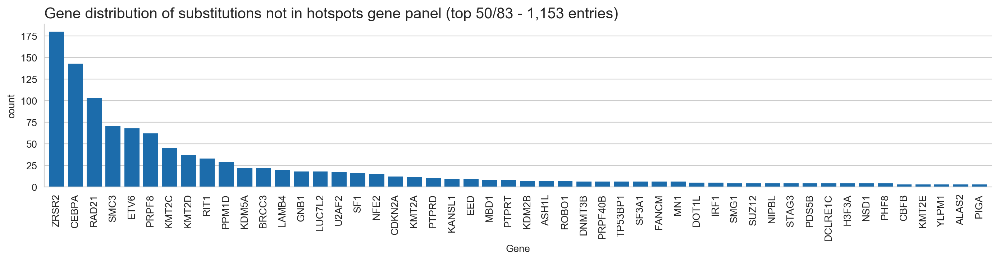

In [37]:
plot_categorical_feature(unreported_hotspots_gene, 'Gene', data_name='substitutions not in hotspots gene panel',
                         save_figure=True, figure_path='report/figures/fig4.png')

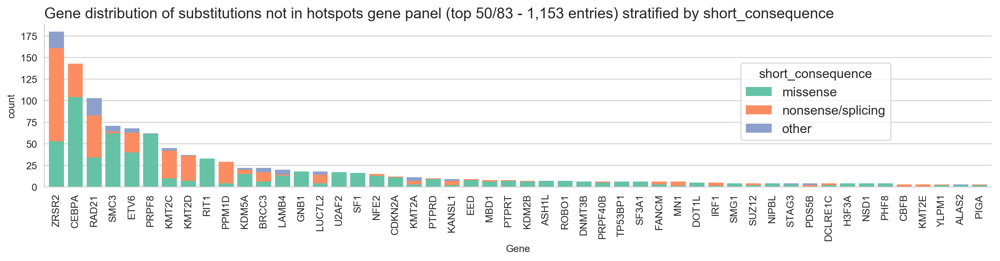

In [58]:
plot_categorical_feature(unreported_hotspots_gene, 'Gene', stratifier_feature_name='short_consequence', data_name='substitutions not in hotspots gene panel',
                         save_figure=True, figure_path='report/figures/fig4.2.png')

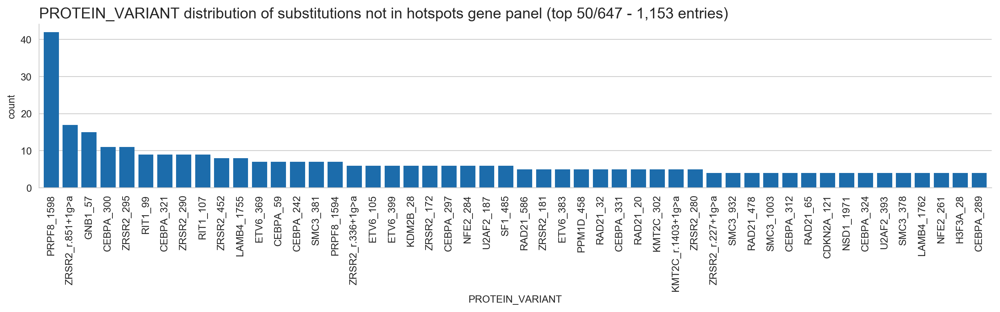

In [39]:
plot_categorical_feature(unreported_hotspots_gene, 'PROTEIN_VARIANT', data_name='substitutions not in hotspots gene panel',
                         save_figure=True, figure_path='report/figures/fig4.3.png')

In [40]:
unreported_substitutions = data.loc[is_sub & (data['status'] == 'in_hotspots_gene_panel_but_not_in_hotspots_list')].copy()

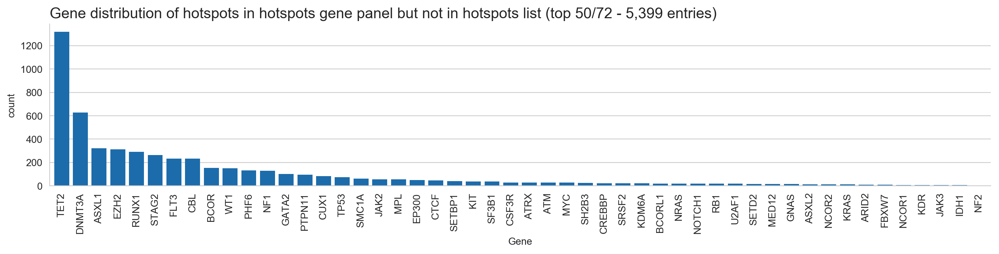

In [41]:
plot_categorical_feature(unreported_substitutions, 'Gene', data_name='hotspots in hotspots gene panel but not in hotspots list',
                         save_figure=True, figure_path='report/figures/fig5.png')

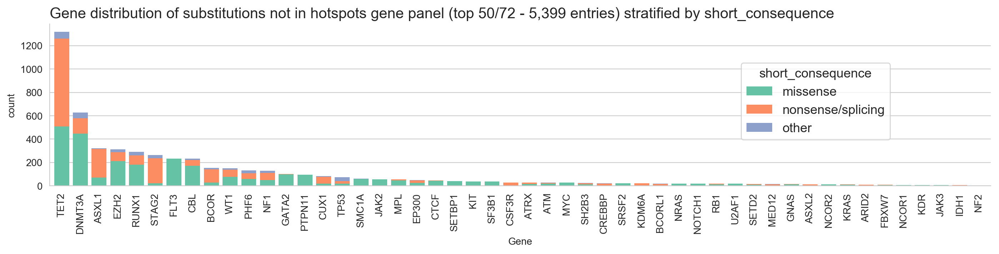

In [57]:
plot_categorical_feature(unreported_substitutions, 'Gene', stratifier_feature_name='short_consequence', data_name='substitutions not in hotspots gene panel',
                         save_figure=True, figure_path='report/figures/fig5.2.png')

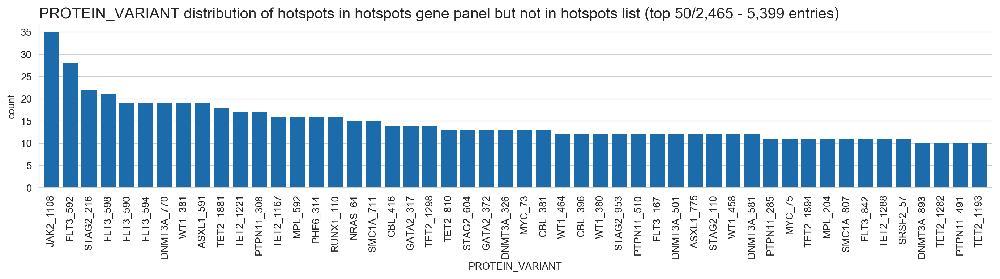

In [43]:
plot_categorical_feature(unreported_substitutions, 'PROTEIN_VARIANT', data_name='hotspots in hotspots gene panel but not in hotspots list',
                         save_figure=True, figure_path='report/figures/fig5.3.png')

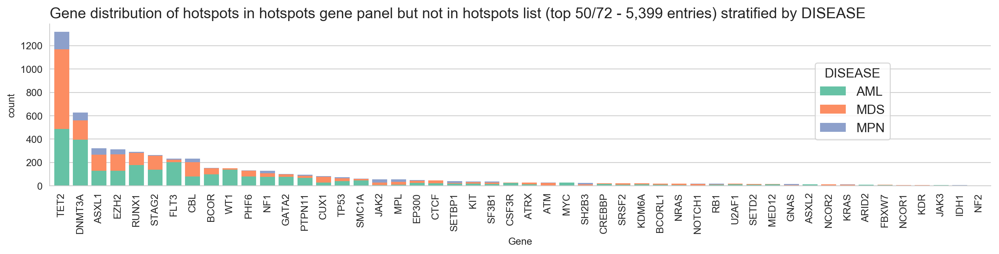

In [44]:
plot_categorical_feature(unreported_substitutions, 'Gene', stratifier_feature_name='DISEASE', data_name='hotspots in hotspots gene panel but not in hotspots list')
                         #save_figure=True, figure_path='report/figures/fig4.4.png')

In [45]:
# export unreported protein variant table to LaTeX format
unreported_substitutions_table = get_table(unreported_substitutions['PROTEIN_VARIANT'], get_frequency=False)
unreported_substitutions_table = unreported_substitutions_table[unreported_substitutions_table['count_'] >= 5]
unreported_substitutions_table = unreported_substitutions_table.reset_index(level=0).rename(columns={'index': 'protein variant', 'count_': 'count'})
display(unreported_substitutions_table.head())

with open('report/dataframes/unreported_substitutions_table.txt', 'w') as text_file:
    print(unreported_substitutions_table.to_latex(index=False, longtable=True), file=text_file)

,protein variant,count
0,JAK2_1108,35
1,FLT3_592,28
2,STAG2_216,22
3,FLT3_598,21
4,FLT3_590,19


# Summary

## By patients

In [46]:
data['ID'].nunique() # number of patients

8966

In [47]:
get_table(data['status'])

,count_,freq_
in_hotspots_list,11015,43.26%
in_hotspots_gene_panel_but_not_in_hotspots_list,5399,21.20%
in_exons_list,5267,20.68%
not_in_exons_gene_panel,2481,9.74%
not_in_hotspots_gene_panel,1153,4.53%
in_exons_gene_panel_but_not_in_exons_list,148,0.58%


In [48]:
# compute short status
data['status_short'] = 'reported'
data.loc[data['status'].isin(['not_in_hotspots_gene_panel', 'in_hotspots_gene_panel_but_not_in_hotspots_list']), 'status_short'] = 'unreported sub'
data.loc[data['status'].isin(['not_in_exons_gene_panel'   , 'in_exons_gene_panel_but_not_in_exons_list'])      , 'status_short'] = 'unreported indel'
get_table(data['status_short'])

,count_,freq_
reported,16282,63.94%
unreported sub,6552,25.73%
unreported indel,2629,10.32%


In [49]:
patient_summary = data.groupby('ID').apply(lambda x: pd.Series({'unreported'       : sum(x['status_short'] != 'reported'),
                                                                'reported'         : sum(x['status_short'] == 'reported'),
                                                                'no_mutation_found': sum(x['status_short'] == 'reported') == 0}))

patient_table = get_table(data['ID'])
patient_table = patient_table.join(patient_summary)
patient_table['%_unreported'] = patient_table['unreported'] / patient_table['count_']
patient_table['%_unreported_string'] = patient_table.apply(lambda x: '{:.1f}%'.format(100 * x['%_unreported']), axis=1)
patient_table.head(10)

,count_,freq_,unreported,reported,no_mutation_found,%_unreported,%_unreported_string
WGA_PD5059a,19,0.07%,18,1,False,0.947368,94.7%
E-H-129527-T1-1-D1-1,13,0.05%,8,5,False,0.615385,61.5%
E-H-129334-T1-1-D1-1,13,0.05%,4,9,False,0.307692,30.8%
E-H-100244-T1-1-D1-1,13,0.05%,6,7,False,0.461538,46.2%
10-012914,12,0.05%,9,3,False,0.750000,75.0%
E-H-128689-T1-1-D1-1,12,0.05%,3,9,False,0.250000,25.0%
E-H-129334-T2-1-D1-1,11,0.04%,4,7,False,0.363636,36.4%
E-H-129708-T1-1-D1-1,11,0.04%,3,8,False,0.272727,27.3%
E-H-116704-T1-1-D1-1,11,0.04%,4,7,False,0.363636,36.4%
E-H-116367-T1-1-D1-1,10,0.04%,6,4,False,0.600000,60.0%


In [50]:
patient_table['%_unreported'].mean()

0.3140995878251827

The table below indicates that no oncogenic mutation is found for **$\approx$8,9%** (774/8,704) of the patients:

In [51]:
get_table(patient_table['no_mutation_found'])

,count_,freq_
False,8255,92.07%
True,711,7.93%


## By genes

In [52]:
# export gene summary table to LaTeX format
gene_summary = data.groupby('Gene').apply(lambda x: pd.Series({'unreported'      : sum(x['status_short'].isin(['unreported sub', 'unreported indel'])),
                                                               'reported'        : sum(x['status_short'] == 'reported'),
                                                               'unreported sub'  : sum(x['status_short'] == 'unreported sub'),
                                                               'unreported indel': sum(x['status_short'] == 'unreported indel')}))
gene_table = get_table(data['Gene'])
gene_table = gene_table.join(gene_summary)
gene_table['% unreported'] = gene_table.apply(lambda x: '{:.1f}%'.format(100 * x['unreported'] / x['count_']), axis=1)
gene_table.index.name = 'gene'
gene_table = gene_table.rename(columns={'count_': 'count', 'freq_': 'freq'})
display(gene_table.head(10))

with open('report/dataframes/gene_summary_table.txt', 'w') as text_file:
    print(gene_table.to_latex(bold_rows=True, longtable=True), file=text_file)

,count,freq,unreported,reported,unreported sub,unreported indel,% unreported
gene,,,,,,,
TET2,3140,12.33%,1347,1793,1320,27,42.9%
DNMT3A,1768,6.94%,634,1134,629,5,35.9%
JAK2,1700,6.68%,69,1631,57,12,4.1%
NPM1,1452,5.70%,4,1448,0,4,0.3%
SRSF2,1294,5.08%,224,1070,23,201,17.3%
RUNX1,1165,4.58%,317,848,292,25,27.2%
ASXL1,1037,4.07%,352,685,321,31,33.9%
NRAS,1032,4.05%,19,1013,19,0,1.8%
SF3B1,917,3.60%,44,873,38,6,4.8%


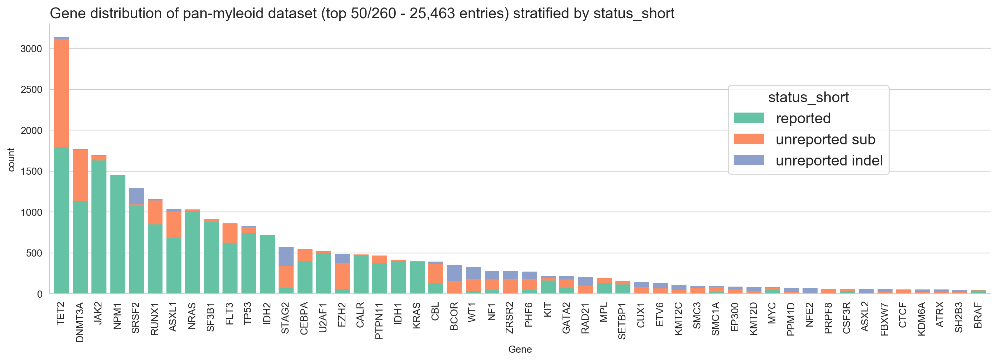

In [53]:
plot_categorical_feature(data, 'Gene', data_name='pan-myleoid dataset', stratifier_feature_name='status_short', figsize=(17, 5), legend_fontsize=15,
                         save_figure=True, figure_path='report/figures/fig6.png')

## Protein variant table summary

In [62]:
dd = data.groupby('PROTEIN_VARIANT').apply(lambda x: pd.Series({'count'            : len(x),
                                                                '\ '                : '|',
                                                                'AML'              : sum(x['DISEASE'] == 'AML'),
                                                                'MPN'              : sum(x['DISEASE'] == 'MPN'),
                                                                'MDS'              : sum(x['DISEASE'] == 'MDS'),
                                                                '\ \ '               : '|',
                                                                'miss.'            : sum(x['short_consequence'] == 'missense'),
                                                                'trunc.'           : sum(x['short_consequence'] == 'truncating'),
                                                                'nons./splice'     : sum(x['short_consequence'] == 'nonsense/splicing'),
                                                                'infr.'            : sum(x['short_consequence'] == 'inframe'),
                                                                'other'            : sum(x['short_consequence'] == 'other'),
                                                                '\ \ \ '              : '|',
                                                                '\checkmark'       : sum(x['status_short'] == 'reported'),
                                                                '$\times$ sub'     : sum(x['status_short'] == 'unreported sub'),
                                                                '$\times$ indel'   : sum(x['status_short'] == 'unreported indel')})).sort_values('count', ascending=False)
dd = dd[dd['count'] >= 10]
dd.index.name = 'protein variant'

display(dd.head())

# export to LaTeX format
with open('report/dataframes/protein_variant_summary_table.txt', 'w') as text_file:
    dd.index = dd.index.str.replace('_', '\_') # escape protein variant '_' character for LaTeX table
    print(dd.to_latex(bold_rows=True, longtable=True, escape=False), file=text_file)

,count,\,AML,MPN,MDS,\ \,miss.,trunc.,nons./splice,infr.,other,\ \ \,\checkmark,$ imes$ sub,$ imes$ indel
protein variant,,,,,,,,,,,,,,,
JAK2_617,1622,|,129,1385,108,|,1622,0,0,0,0,|,1622,0,0
NPM1_288,1396,|,1340,0,56,|,0,1396,0,0,0,|,1396,0,0
SRSF2_95,1203,|,574,36,593,|,1070,0,0,133,0,|,1070,0,133
DNMT3A_882,739,|,617,31,91,|,739,0,0,0,0,|,739,0,0
IDH2_140,573,|,445,16,112,|,573,0,0,0,0,|,573,0,0


In [63]:
# save the data for the next parts
data.to_csv('data/processed/genetics_final_processed.tsv', sep='\t')

# Lolliplots

To run this part you need to:

- Have go installed on your computer
- Clone the https://github.com/pbnjay/lollipops repository in the `heme_panel_optimisation/` repository:
    ```bash
    $ git clone https://github.com/pbnjay/lollipops
    ```
- Try to run the following in the notebook to make sure it works:

In [4]:
# create test lollipop
!go run ./lollipops/ -o temp/test.png -legend -labels -w=6000 -dpi=200 DNMT3A T125@5

HGNC Symbol:  DNMT3A
Get http://www.uniprot.org/uniprot/?query=DNMT3A+AND+reviewed:yes+AND+organism:9606+AND+database:pfam&sort=score&columns=id,entry+name,reviewed,genes,organism&format=tab: dial tcp: lookup www.uniprot.org: no such host
exit status 1


In [70]:
# check if it worked
from IPython.display import display, Markdown

display(Markdown('![](temp/test.png)'))

![](temp/test.png)

In [71]:
# remove test.png
!rm -f temp/test.png

In [3]:
data = pd.read_csv('data/processed/genetics_final_processed.tsv', sep='\t', low_memory=False)
data.head()

# create the is_sub mask: data[is_sub] contains all the sub mutations, data[~is_sub] contains all the indels
is_sub = (data['type'] == 'Sub')

In [73]:
get_table(data['status'])

,count_,freq_
in_hotspots_list,11015,43.26%
in_hotspots_gene_panel_but_not_in_hotspots_list,5399,21.20%
in_exons_list,5267,20.68%
not_in_exons_gene_panel,2481,9.74%
not_in_hotspots_gene_panel,1153,4.53%
in_exons_gene_panel_but_not_in_exons_list,148,0.58%


Let's find the pattern in `PROTEIN_CHANGE` not matching something like `p.A601...`, `p.*32...` or `p.?`

In [74]:
data[~data['PROTEIN_CHANGE'].str.match('p.([A-Z*][0-9]{1,3}|\?$)')]

,Unnamed: 0,ID,Gene,Chr,Begin,End,Ref,Obs,TotRead,VAF,TRANSCRIPT,RNA_CHANGE,CDNA_CHANGE,PROTEIN_CHANGE,CONSEQUENCE,type,Annotation,dataset,ID_VARIANT,PROTEIN_VARIANT,PROTEIN_POS,DISEASE,UNIQUE_VARIANT,mutation_type,hotspot,hotspot_type,variable,VAF.corr,LCI.corr,UCI.corr,correction,data_source,annotation_Pierre,short_consequence,status,status_short
18376,18447,PD25344c,NAAA,chr4,76834219.0,76834219.0,CA,C,309.0,0.521036,CCDS43238,r.?,-,-,intron_variant,Del,ONCOGENIC,AML MRC,4_76834219_CA_C,NAAA_r.?,NaN,AML,PD25344c_chr4_76834219_CA_C,other,NaN,NaN,NAAA,0.521036,0.465379,0.576167,None,CAVEMAN/PINDEL,oncogenic,other,not_in_exons_gene_panel,unreported indel
23829,23907,WGA_PD10517c,BEND6,chr6,56819403.0,56819404.0,G,GCGAGG,NaN,0.300000,CCDS83102.1,r.?,-,-,2KB_upstream_variant,Ins,ONCOGENIC,MPN PT1 Trial,6_56819403_G_GCGAGG,BEND6_r.?,NaN,MPN,WGA_PD10517c_chr6_56819403_G_GCGAGG,other,NaN,NaN,BEND6,0.300000,NaN,NaN,None,CAVEMAN/PINDEL,oncogenic,other,not_in_exons_gene_panel,unreported indel
24472,24553,WGA_PD12158a,BEND6,chr6,56819403.0,56819404.0,G,GCGAGG,NaN,0.235294,CCDS83102.1,r.?,-,-,2KB_upstream_variant,Ins,ONCOGENIC,MPN Florence,6_56819403_G_GCGAGG,BEND6_r.?,NaN,MPN,WGA_PD12158a_chr6_56819403_G_GCGAGG,other,NaN,NaN,BEND6,0.235294,NaN,NaN,None,CAVEMAN/PINDEL,oncogenic,other,not_in_exons_gene_panel,unreported indel
24921,25003,WGA_PD13033a,PCDH15,chr10,55584887.0,55584891.0,TTTAC,T,NaN,0.470588,CCDS44402,r.?,-,-,intron_variant,Del,ONCOGENIC,MPN UK,10_55584887_TTTAC_T,PCDH15_r.?,NaN,MPN,WGA_PD13033a_chr10_55584887_TTTAC_T,other,NaN,NaN,PCDH15,0.470588,NaN,NaN,None,CAVEMAN/PINDEL,oncogenic,other,not_in_exons_gene_panel,unreported indel


In [75]:
from IPython.display import display, Markdown
from IPython.utils import io
import re

def get_label(protein_change_list):
    """
    Return label corresponding to a given protein change list, return 'error' if no correct label was found
    → Ex:
        >>> get_label(['p.A601*fs', 'p.?', 'p.P22R', 'p.A226T'])
            A601*fs/R/T
    → Arguments
        - protein_change_list: list of protein change
    """
    # filter the incorrect protein change or the p.? protein change (splicing)
    regexp = re.compile('^p.[A-Z*][0-9]{1,3}')
    protein_change_list = list(filter(regexp.match, protein_change_list))
    if len(protein_change_list) == 0:
        return 'error'
    
    # get first change and remove 'p.'
    label = protein_change_list[0][2:]
    
    # add other pchange
    # ⚠️ The following line are incorrect as they only add the last character of the other pchanges,
    #    would be smarter to grep out anything before the protein position and add to the label
    #    what's after
    for other_pchange in protein_change_list[1:]:
        label += '/' + other_pchange[-1]
    
    # escape > character
    label = label.replace('>', '\>')
    
    return label


def get_color(consequence_list):
    """
    Return color corresponding to mutation consequence between missense, inframe, nonsense/splicing, truncating or other.
    """
    # if more than one consequence
    if len(consequence_list) > 1:
        return '#9B77DA' # purple
    
    consequence = consequence_list[0]

    if consequence == 'missense' or consequence == 'inframe':
        return '#1C6CAB' # blue
    elif consequence == 'nonsense/splicing' or consequence == 'truncating':
        return '#D95858' # red
    else:
        return '#76A665' # green

    
def create_lolliplot(data, gene, plot_path, verbose=True, script_parameters='-w=5000 -dpi=200 -labels', add_count_to_label=False, uniprot_id=None):
    """
    Create lolliplot of a given gene using the https://github.com/pbnjay/lollipops repository
    → Arguments
        - data              : pandas dataframe with columns PROTEIN_POS, PROTEIN_CHANGE and short_consequence
        - gene              : gene symbol
        - plot_path         : lolliplots .png/.svg path
        - verbose           : set to True to see script information
        - script_parameters : parameters passed to the script
        - add_count_to_label: add counts between parenthesis to each mutation in the plot
        - uniprot_id        : Uniprot ID to use
    """
    display(Markdown('**{}**'.format(plot_path)))
    
    dd = data[data['Gene'] == gene]
    
    # create a table with one row per protein position
    protein_pos_table = dd.groupby('PROTEIN_POS').apply(lambda x: pd.Series({'count': len(x),
                                                                             'label': get_label(x['PROTEIN_CHANGE'].unique()),
                                                                             'color': get_color(x['short_consequence'].unique())}))
    
    # if no mutation found in this gene we quit
    if protein_pos_table.size == 0:
        print('No mutation found.')
        return
    
    protein_pos_table = protein_pos_table[protein_pos_table['label'] != 'error']
    
     # if no mutation found in this gene we quit
    if protein_pos_table.size == 0:
        print('No mutation found.')
        return
    
    # compute size, label and final code for each protein position
    protein_pos_table['size'] = '@' + (protein_pos_table['count'].astype(int) ** 3).astype(str)
    if add_count_to_label:
        protein_pos_table['label'] = protein_pos_table['label'] + '\ \(' + protein_pos_table['count'].astype(str) + '\)'
    protein_pos_table['code']  = protein_pos_table['label'] + protein_pos_table['color'] + protein_pos_table['size']

    # compute position parameter for the script
    position_parameter = protein_pos_table['code'].str.cat(sep=' ')
    
    # replace gene by Uniprot id
    if uniprot_id:
        gene = '-U ' + uniprot_id
    
    # run the script
    if verbose:
        display(protein_pos_table.head(5))
        print('go run ./lollipops/ -o {} {} {} {}'.format(plot_path, script_parameters, gene, position_parameter))
        !go run ./lollipops/ -o {plot_path} {script_parameters} {gene} {position_parameter}
    else:
        output = !go run ./lollipops/ -o {plot_path} {script_parameters} {gene} {position_parameter}

    display(Markdown('![]({})'.format(plot_path)))

Let's see some use example:

In [76]:
create_lolliplot(data.head(50), 'TET2', plot_path='temp/test.png', verbose=True)

**temp/test.png**

,count,label,color,size,code
PROTEIN_POS,,,,,
163.0,1,F163fs*20,#D95858,@1,F163fs*20#D95858@1
335.0,1,P335fs*4,#D95858,@1,P335fs*4#D95858@1
591.0,1,Q591*,#D95858,@1,Q591*#D95858@1
646.0,1,T646fs*54,#D95858,@1,T646fs*54#D95858@1
743.0,1,Q743*,#D95858,@1,Q743*#D95858@1


go run ./lollipops/ -o temp/test.png -w=5000 -dpi=200 -labels TET2 F163fs*20#D95858@1 P335fs*4#D95858@1 Q591*#D95858@1 T646fs*54#D95858@1 Q743*#D95858@1 Q758fs*55#D95858@1 S1203R#1C6CAB@1 Y1245fs*22#D95858@1 N1266fs*97#D95858@1 P1619L#1C6CAB@1
HGNC Symbol:  TET2
Uniprot/SwissProt Accession:  Q6N021
Drawing diagram to temp/test.png


![](temp/test.png)

In [77]:
create_lolliplot(data.head(50), 'TET2', plot_path='temp/test.png', verbose=True, add_count_to_label=True)

**temp/test.png**

,count,label,color,size,code
PROTEIN_POS,,,,,
163.0,1,F163fs*20\ \(1\),#D95858,@1,F163fs*20\ \(1\)#D95858@1
335.0,1,P335fs*4\ \(1\),#D95858,@1,P335fs*4\ \(1\)#D95858@1
591.0,1,Q591*\ \(1\),#D95858,@1,Q591*\ \(1\)#D95858@1
646.0,1,T646fs*54\ \(1\),#D95858,@1,T646fs*54\ \(1\)#D95858@1
743.0,1,Q743*\ \(1\),#D95858,@1,Q743*\ \(1\)#D95858@1


go run ./lollipops/ -o temp/test.png -w=5000 -dpi=200 -labels TET2 F163fs*20\ \(1\)#D95858@1 P335fs*4\ \(1\)#D95858@1 Q591*\ \(1\)#D95858@1 T646fs*54\ \(1\)#D95858@1 Q743*\ \(1\)#D95858@1 Q758fs*55\ \(1\)#D95858@1 S1203R\ \(1\)#1C6CAB@1 Y1245fs*22\ \(1\)#D95858@1 N1266fs*97\ \(1\)#D95858@1 P1619L\ \(1\)#1C6CAB@1
HGNC Symbol:  TET2
Uniprot/SwissProt Accession:  Q6N021
Drawing diagram to temp/test.png


![](temp/test.png)

In [78]:
create_lolliplot(data.head(50), 'TET2', plot_path='temp/test.png', verbose=False, add_count_to_label=True)

**temp/test.png**

![](temp/test.png)

In [79]:
create_lolliplot(data.head(50), 'TET2', plot_path='temp/test.png', verbose=True, uniprot_id='Q6N021')

**temp/test.png**

,count,label,color,size,code
PROTEIN_POS,,,,,
163.0,1,F163fs*20,#D95858,@1,F163fs*20#D95858@1
335.0,1,P335fs*4,#D95858,@1,P335fs*4#D95858@1
591.0,1,Q591*,#D95858,@1,Q591*#D95858@1
646.0,1,T646fs*54,#D95858,@1,T646fs*54#D95858@1
743.0,1,Q743*,#D95858,@1,Q743*#D95858@1


go run ./lollipops/ -o temp/test.png -w=5000 -dpi=200 -labels -U Q6N021 F163fs*20#D95858@1 P335fs*4#D95858@1 Q591*#D95858@1 T646fs*54#D95858@1 Q743*#D95858@1 Q758fs*55#D95858@1 S1203R#1C6CAB@1 Y1245fs*22#D95858@1 N1266fs*97#D95858@1 P1619L#1C6CAB@1
Pfam Symbol:  TET2_HUMAN
Drawing diagram to temp/test.png


![](temp/test.png)

In [80]:
create_lolliplot(data.head(50), 'TET2', plot_path='temp/test.png', verbose=True, script_parameters='-w=3000 -dpi=200')

**temp/test.png**

,count,label,color,size,code
PROTEIN_POS,,,,,
163.0,1,F163fs*20,#D95858,@1,F163fs*20#D95858@1
335.0,1,P335fs*4,#D95858,@1,P335fs*4#D95858@1
591.0,1,Q591*,#D95858,@1,Q591*#D95858@1
646.0,1,T646fs*54,#D95858,@1,T646fs*54#D95858@1
743.0,1,Q743*,#D95858,@1,Q743*#D95858@1


go run ./lollipops/ -o temp/test.png -w=3000 -dpi=200 TET2 F163fs*20#D95858@1 P335fs*4#D95858@1 Q591*#D95858@1 T646fs*54#D95858@1 Q743*#D95858@1 Q758fs*55#D95858@1 S1203R#1C6CAB@1 Y1245fs*22#D95858@1 N1266fs*97#D95858@1 P1619L#1C6CAB@1
HGNC Symbol:  TET2
Uniprot/SwissProt Accession:  Q6N021
Drawing diagram to temp/test.png


![](temp/test.png)

In [81]:
# remove test.png
!rm -f temp/test.png

## Substitutions

Let's create a lolliplot plot for the 33 most reccurent gene, one for the unreported substitutions and one for the reported substitutions:

In [82]:
for gene in get_table(data['Gene']).head(33).index:
    
    # create lolliplots for unreported
    create_lolliplot(data[data['status_short'] == 'unreported sub'],
                     gene, plot_path='report/lolliplots/substitutions/{}_unreported.png'.format(gene), verbose=False, script_parameters='-w=5000 -dpi=200')

    # create lolliplots for reported
    create_lolliplot(data[is_sub & (data['status_short'] == 'reported')],
                     gene, plot_path='report/lolliplots/substitutions/{}_reported.png'  .format(gene), verbose=False, script_parameters='-w=5000 -dpi=200')

**report/lolliplots/substitutions/TET2_unreported.png**

![](report/lolliplots/substitutions/TET2_unreported.png)

**report/lolliplots/substitutions/TET2_reported.png**

![](report/lolliplots/substitutions/TET2_reported.png)

**report/lolliplots/substitutions/DNMT3A_unreported.png**

![](report/lolliplots/substitutions/DNMT3A_unreported.png)

**report/lolliplots/substitutions/DNMT3A_reported.png**

![](report/lolliplots/substitutions/DNMT3A_reported.png)

**report/lolliplots/substitutions/JAK2_unreported.png**

![](report/lolliplots/substitutions/JAK2_unreported.png)

**report/lolliplots/substitutions/JAK2_reported.png**

![](report/lolliplots/substitutions/JAK2_reported.png)

**report/lolliplots/substitutions/NPM1_unreported.png**

No mutation found.


**report/lolliplots/substitutions/NPM1_reported.png**

No mutation found.


**report/lolliplots/substitutions/SRSF2_unreported.png**

![](report/lolliplots/substitutions/SRSF2_unreported.png)

**report/lolliplots/substitutions/SRSF2_reported.png**

![](report/lolliplots/substitutions/SRSF2_reported.png)

**report/lolliplots/substitutions/RUNX1_unreported.png**

![](report/lolliplots/substitutions/RUNX1_unreported.png)

**report/lolliplots/substitutions/RUNX1_reported.png**

![](report/lolliplots/substitutions/RUNX1_reported.png)

**report/lolliplots/substitutions/ASXL1_unreported.png**

![](report/lolliplots/substitutions/ASXL1_unreported.png)

**report/lolliplots/substitutions/ASXL1_reported.png**

![](report/lolliplots/substitutions/ASXL1_reported.png)

**report/lolliplots/substitutions/NRAS_unreported.png**

![](report/lolliplots/substitutions/NRAS_unreported.png)

**report/lolliplots/substitutions/NRAS_reported.png**

![](report/lolliplots/substitutions/NRAS_reported.png)

**report/lolliplots/substitutions/SF3B1_unreported.png**

![](report/lolliplots/substitutions/SF3B1_unreported.png)

**report/lolliplots/substitutions/SF3B1_reported.png**

![](report/lolliplots/substitutions/SF3B1_reported.png)

**report/lolliplots/substitutions/FLT3_unreported.png**

![](report/lolliplots/substitutions/FLT3_unreported.png)

**report/lolliplots/substitutions/FLT3_reported.png**

![](report/lolliplots/substitutions/FLT3_reported.png)

**report/lolliplots/substitutions/TP53_unreported.png**

![](report/lolliplots/substitutions/TP53_unreported.png)

**report/lolliplots/substitutions/TP53_reported.png**

![](report/lolliplots/substitutions/TP53_reported.png)

**report/lolliplots/substitutions/IDH2_unreported.png**

![](report/lolliplots/substitutions/IDH2_unreported.png)

**report/lolliplots/substitutions/IDH2_reported.png**

![](report/lolliplots/substitutions/IDH2_reported.png)

**report/lolliplots/substitutions/STAG2_unreported.png**

![](report/lolliplots/substitutions/STAG2_unreported.png)

**report/lolliplots/substitutions/STAG2_reported.png**

![](report/lolliplots/substitutions/STAG2_reported.png)

**report/lolliplots/substitutions/CEBPA_unreported.png**

![](report/lolliplots/substitutions/CEBPA_unreported.png)

**report/lolliplots/substitutions/CEBPA_reported.png**

No mutation found.


**report/lolliplots/substitutions/U2AF1_unreported.png**

![](report/lolliplots/substitutions/U2AF1_unreported.png)

**report/lolliplots/substitutions/U2AF1_reported.png**

![](report/lolliplots/substitutions/U2AF1_reported.png)

**report/lolliplots/substitutions/EZH2_unreported.png**

![](report/lolliplots/substitutions/EZH2_unreported.png)

**report/lolliplots/substitutions/EZH2_reported.png**

![](report/lolliplots/substitutions/EZH2_reported.png)

**report/lolliplots/substitutions/CALR_unreported.png**

![](report/lolliplots/substitutions/CALR_unreported.png)

**report/lolliplots/substitutions/CALR_reported.png**

No mutation found.


**report/lolliplots/substitutions/PTPN11_unreported.png**

![](report/lolliplots/substitutions/PTPN11_unreported.png)

**report/lolliplots/substitutions/PTPN11_reported.png**

![](report/lolliplots/substitutions/PTPN11_reported.png)

**report/lolliplots/substitutions/IDH1_unreported.png**

![](report/lolliplots/substitutions/IDH1_unreported.png)

**report/lolliplots/substitutions/IDH1_reported.png**

![](report/lolliplots/substitutions/IDH1_reported.png)

**report/lolliplots/substitutions/KRAS_unreported.png**

![](report/lolliplots/substitutions/KRAS_unreported.png)

**report/lolliplots/substitutions/KRAS_reported.png**

![](report/lolliplots/substitutions/KRAS_reported.png)

**report/lolliplots/substitutions/CBL_unreported.png**

![](report/lolliplots/substitutions/CBL_unreported.png)

**report/lolliplots/substitutions/CBL_reported.png**

![](report/lolliplots/substitutions/CBL_reported.png)

**report/lolliplots/substitutions/BCOR_unreported.png**

![](report/lolliplots/substitutions/BCOR_unreported.png)

**report/lolliplots/substitutions/BCOR_reported.png**

![](report/lolliplots/substitutions/BCOR_reported.png)

**report/lolliplots/substitutions/WT1_unreported.png**

![](report/lolliplots/substitutions/WT1_unreported.png)

**report/lolliplots/substitutions/WT1_reported.png**

![](report/lolliplots/substitutions/WT1_reported.png)

**report/lolliplots/substitutions/NF1_unreported.png**

![](report/lolliplots/substitutions/NF1_unreported.png)

**report/lolliplots/substitutions/NF1_reported.png**

![](report/lolliplots/substitutions/NF1_reported.png)

**report/lolliplots/substitutions/ZRSR2_unreported.png**

![](report/lolliplots/substitutions/ZRSR2_unreported.png)

**report/lolliplots/substitutions/ZRSR2_reported.png**

No mutation found.


**report/lolliplots/substitutions/PHF6_unreported.png**

![](report/lolliplots/substitutions/PHF6_unreported.png)

**report/lolliplots/substitutions/PHF6_reported.png**

![](report/lolliplots/substitutions/PHF6_reported.png)

**report/lolliplots/substitutions/KIT_unreported.png**

![](report/lolliplots/substitutions/KIT_unreported.png)

**report/lolliplots/substitutions/KIT_reported.png**

![](report/lolliplots/substitutions/KIT_reported.png)

**report/lolliplots/substitutions/GATA2_unreported.png**

![](report/lolliplots/substitutions/GATA2_unreported.png)

**report/lolliplots/substitutions/GATA2_reported.png**

![](report/lolliplots/substitutions/GATA2_reported.png)

**report/lolliplots/substitutions/RAD21_unreported.png**

![](report/lolliplots/substitutions/RAD21_unreported.png)

**report/lolliplots/substitutions/RAD21_reported.png**

No mutation found.


**report/lolliplots/substitutions/MPL_unreported.png**

![](report/lolliplots/substitutions/MPL_unreported.png)

**report/lolliplots/substitutions/MPL_reported.png**

![](report/lolliplots/substitutions/MPL_reported.png)

**report/lolliplots/substitutions/SETBP1_unreported.png**

![](report/lolliplots/substitutions/SETBP1_unreported.png)

**report/lolliplots/substitutions/SETBP1_reported.png**

![](report/lolliplots/substitutions/SETBP1_reported.png)

**report/lolliplots/substitutions/CUX1_unreported.png**

![](report/lolliplots/substitutions/CUX1_unreported.png)

**report/lolliplots/substitutions/CUX1_reported.png**

![](report/lolliplots/substitutions/CUX1_reported.png)

**report/lolliplots/substitutions/ETV6_unreported.png**

![](report/lolliplots/substitutions/ETV6_unreported.png)

**report/lolliplots/substitutions/ETV6_reported.png**

No mutation found.


## Substitutions - `SETBP1`, `PHF61` error

For some reason the Uniprot symbol couldn't be found for `PHF6` and `SETBP1`, let's set `verbose=True` to see the error:

In [83]:
for gene in ['PHF6', 'SETBP1']:
    
    # create lolliplots for unreported
    create_lolliplot(data[data['status_short'] == 'unreported sub'],
                     gene, plot_path='report/lolliplots/substitutions/{}_unreported.png'.format(gene), verbose=True, script_parameters='-w=5000 -dpi=200')

    # create lolliplots for reported
    create_lolliplot(data[is_sub & (data['status_short'] == 'reported')],
                     gene, plot_path='report/lolliplots/substitutions/{}_reported.png'  .format(gene), verbose=True, script_parameters='-w=5000 -dpi=200')

**report/lolliplots/substitutions/PHF6_unreported.png**

,count,label,color,size,code
PROTEIN_POS,,,,,
1.0,2,M1I,#76A665,@8,M1I#76A665@8
17.0,1,C17*,#D95858,@1,C17*#D95858@1
23.0,1,N23S,#1C6CAB,@1,N23S#1C6CAB@1
27.0,2,E27*,#D95858,@8,E27*#D95858@8
28.0,1,C28*,#D95858,@1,C28*#D95858@1


go run ./lollipops/ -o report/lolliplots/substitutions/PHF6_unreported.png -w=5000 -dpi=200 PHF6 M1I#76A665@8 C17*#D95858@1 N23S#1C6CAB@1 E27*#D95858@8 C28*#D95858@1 G29*#D95858@1 L31*#D95858@1 E35*#D95858@1 K44*#D95858@1 L47P#1C6CAB@1 C94*#D95858@1 A108V/T#1C6CAB@27 K112*#D95858@1 S120*#D95858@1 Y124*#D95858@1 L142*#D95858@1 E150*#D95858@1 S155*#D95858@8 R163C#1C6CAB@1 K169*#D95858@1 G213R#1C6CAB@1 E219*#D95858@1 R225*#D95858@216 K235E#1C6CAB@1 A237T#1C6CAB@1 H239L/R#1C6CAB@27 Y240C#1C6CAB@27 C242S/F#1C6CAB@8 M243I#1C6CAB@1 S256*#D95858@1 E259*#D95858@1 Q270*#D95858@1 G275E/V/R#1C6CAB@27 Q285*#D95858@27 G287V/D/A#1C6CAB@216 T289A#1C6CAB@1 E293*/K#9B77DA@8 C297S#1C6CAB@1 T300A/P/I#1C6CAB@64 Y301*#D95858@1 H302L/R#1C6CAB@64 C305Y#1C6CAB@8 G306R#1C6CAB@1 I314T#1C6CAB@4096 S318*#D95858@1 Y325C#1C6CAB@1 H329R#1C6CAB@8 E334*#D95858@1 R342*#D95858@64
HGNC Symbol:  PHF6
Uniprot returned 3 hits for your gene symbol 'PHF6':
Entry	Entry name	Status	Gene names	Organism
Q09028	RBBP4_HUMAN	reviewed

![](report/lolliplots/substitutions/PHF6_unreported.png)

**report/lolliplots/substitutions/PHF6_reported.png**

,count,label,color,size,code
PROTEIN_POS,,,,,
116.0,7,R116*,#D95858,@343,R116*#D95858@343
129.0,7,R129*,#D95858,@343,R129*#D95858@343
274.0,31,R274Q/*/L,#9B77DA,@29791,R274Q/*/L#9B77DA@29791
319.0,5,R319*,#D95858,@125,R319*#D95858@125


go run ./lollipops/ -o report/lolliplots/substitutions/PHF6_reported.png -w=5000 -dpi=200 PHF6 R116*#D95858@343 R129*#D95858@343 R274Q/*/L#9B77DA@29791 R319*#D95858@125
HGNC Symbol:  PHF6
Uniprot returned 3 hits for your gene symbol 'PHF6':
Entry	Entry name	Status	Gene names	Organism
Q09028	RBBP4_HUMAN	reviewed	RBBP4 RBAP48	Homo sapiens (Human)
P17480	UBF1_HUMAN	reviewed	UBTF UBF UBF1	Homo sapiens (Human)

Unable to find protein ID for 'PHF6' (use -U XX to select one of the above)
exit status 1


![](report/lolliplots/substitutions/PHF6_reported.png)

**report/lolliplots/substitutions/SETBP1_unreported.png**

,count,label,color,size,code
PROTEIN_POS,,,,,
16.0,2,E16K,#1C6CAB,@8,E16K#1C6CAB@8
21.0,2,P21L,#1C6CAB,@8,P21L#1C6CAB@8
54.0,2,R54H,#1C6CAB,@8,R54H#1C6CAB@8
463.0,2,R463H,#1C6CAB,@8,R463H#1C6CAB@8
627.0,1,R627H,#1C6CAB,@1,R627H#1C6CAB@1


go run ./lollipops/ -o report/lolliplots/substitutions/SETBP1_unreported.png -w=5000 -dpi=200 SETBP1 E16K#1C6CAB@8 P21L#1C6CAB@8 R54H#1C6CAB@8 R463H#1C6CAB@8 R627H#1C6CAB@1 E850D#1C6CAB@1 S869R/N/G#1C6CAB@512 G872R#1C6CAB@216 R889Q#1C6CAB@1 D895N#1C6CAB@1 H971Q#1C6CAB@1 T1078M#1C6CAB@8 P1198L#1C6CAB@8 T1260M#1C6CAB@1 T1387M#1C6CAB@8 R1402W/Q#1C6CAB@125
HGNC Symbol:  SETBP1
Uniprot returned 8 hits for your gene symbol 'SETBP1':
Entry	Entry name	Status	Gene names	Organism
Q01105	SET_HUMAN	reviewed	SET	Homo sapiens (Human)
Q9H8W4	PKHF2_HUMAN	reviewed	PLEKHF2 ZFYVE18	Homo sapiens (Human)
G2XKQ0	SUMO5_HUMAN	reviewed	SUMO1P1 SUMO5 UBL2 UBL6	Homo sapiens (Human)
Q8IY57	YAF2_HUMAN	reviewed	YAF2	Homo sapiens (Human)
Q9NS26	SPNXA_HUMAN	reviewed	SPANXA1 SPANXA; SPANXA2	Homo sapiens (Human)
Q9NY87	SPNXC_HUMAN	reviewed	SPANXC	Homo sapiens (Human)
Q9BXN6	SPNXD_HUMAN	reviewed	SPANXD SPANXE	Homo sapiens (Human)

Unable to find protein ID for 'SETBP1' (use -U XX to select one of the above)
exit status 

![](report/lolliplots/substitutions/SETBP1_unreported.png)

**report/lolliplots/substitutions/SETBP1_reported.png**

,count,label,color,size,code
PROTEIN_POS,,,,,
868.0,53,D868G/N/Y/H,#1C6CAB,@148877,D868G/N/Y/H#1C6CAB@148877
870.0,57,G870S/D/R/V/A,#1C6CAB,@185193,G870S/D/R/V/A#1C6CAB@185193
871.0,7,I871T,#1C6CAB,@343,I871T#1C6CAB@343


go run ./lollipops/ -o report/lolliplots/substitutions/SETBP1_reported.png -w=5000 -dpi=200 SETBP1 D868G/N/Y/H#1C6CAB@148877 G870S/D/R/V/A#1C6CAB@185193 I871T#1C6CAB@343
HGNC Symbol:  SETBP1
Uniprot returned 8 hits for your gene symbol 'SETBP1':
Entry	Entry name	Status	Gene names	Organism
Q01105	SET_HUMAN	reviewed	SET	Homo sapiens (Human)
Q9H8W4	PKHF2_HUMAN	reviewed	PLEKHF2 ZFYVE18	Homo sapiens (Human)
G2XKQ0	SUMO5_HUMAN	reviewed	SUMO1P1 SUMO5 UBL2 UBL6	Homo sapiens (Human)
Q8IY57	YAF2_HUMAN	reviewed	YAF2	Homo sapiens (Human)
Q9NS26	SPNXA_HUMAN	reviewed	SPANXA1 SPANXA; SPANXA2	Homo sapiens (Human)
Q9NY87	SPNXC_HUMAN	reviewed	SPANXC	Homo sapiens (Human)
Q9BXN6	SPNXD_HUMAN	reviewed	SPANXD SPANXE	Homo sapiens (Human)

Unable to find protein ID for 'SETBP1' (use -U XX to select one of the above)
exit status 1


![](report/lolliplots/substitutions/SETBP1_reported.png)

We will do it manually by adding the Uniprot ID found on https://www.uniprot.org/ (by entering `PHF6` and `SETBP1` in the search bar) to the script parameters:

In [84]:
for gene, uniprot_id in zip(['PHF6', 'SETBP1'], ['Q8IWS0', 'Q9Y6X0']):
    
    # create lolliplots for unreported
    create_lolliplot(data[data['status_short'] == 'unreported sub'],
                     gene, plot_path='report/lolliplots/substitutions/{}_unreported.png'.format(gene), verbose=False, script_parameters='-w=5000 -dpi=200', uniprot_id=uniprot_id)

    # create lolliplots for reported
    create_lolliplot(data[is_sub & (data['status_short'] == 'reported')],
                     gene, plot_path='report/lolliplots/substitutions/{}_reported.png'  .format(gene), verbose=False, script_parameters='-w=5000 -dpi=200', uniprot_id=uniprot_id)

**report/lolliplots/substitutions/PHF6_unreported.png**

![](report/lolliplots/substitutions/PHF6_unreported.png)

**report/lolliplots/substitutions/PHF6_reported.png**

![](report/lolliplots/substitutions/PHF6_reported.png)

**report/lolliplots/substitutions/SETBP1_unreported.png**

![](report/lolliplots/substitutions/SETBP1_unreported.png)

**report/lolliplots/substitutions/SETBP1_reported.png**

![](report/lolliplots/substitutions/SETBP1_reported.png)

## Indels

Let's create a lolliplot plot for the 33 most reccurent gene, one for the unreported indels and one for the reported indels:

In [85]:
for gene in get_table(data['Gene']).head(33).index:
    
    # create lolliplots for unreported
    create_lolliplot(data[data['status_short'] == 'unreported indel'],
                     gene, plot_path='report/lolliplots/indels/{}_unreported.png'.format(gene), verbose=False, script_parameters='-w=5000 -dpi=200')

    # create lolliplots for reported
    create_lolliplot(data[~is_sub & (data['status_short'] == 'reported')],
                     gene, plot_path='report/lolliplots/indels/{}_reported.png'  .format(gene), verbose=False, script_parameters='-w=5000 -dpi=200')

**report/lolliplots/indels/TET2_unreported.png**

![](report/lolliplots/indels/TET2_unreported.png)

**report/lolliplots/indels/TET2_reported.png**

![](report/lolliplots/indels/TET2_reported.png)

**report/lolliplots/indels/DNMT3A_unreported.png**

![](report/lolliplots/indels/DNMT3A_unreported.png)

**report/lolliplots/indels/DNMT3A_reported.png**

![](report/lolliplots/indels/DNMT3A_reported.png)

**report/lolliplots/indels/JAK2_unreported.png**

![](report/lolliplots/indels/JAK2_unreported.png)

**report/lolliplots/indels/JAK2_reported.png**

No mutation found.


**report/lolliplots/indels/NPM1_unreported.png**

![](report/lolliplots/indels/NPM1_unreported.png)

**report/lolliplots/indels/NPM1_reported.png**

![](report/lolliplots/indels/NPM1_reported.png)

**report/lolliplots/indels/SRSF2_unreported.png**

![](report/lolliplots/indels/SRSF2_unreported.png)

**report/lolliplots/indels/SRSF2_reported.png**

No mutation found.


**report/lolliplots/indels/RUNX1_unreported.png**

![](report/lolliplots/indels/RUNX1_unreported.png)

**report/lolliplots/indels/RUNX1_reported.png**

![](report/lolliplots/indels/RUNX1_reported.png)

**report/lolliplots/indels/ASXL1_unreported.png**

![](report/lolliplots/indels/ASXL1_unreported.png)

**report/lolliplots/indels/ASXL1_reported.png**

![](report/lolliplots/indels/ASXL1_reported.png)

**report/lolliplots/indels/NRAS_unreported.png**

No mutation found.


**report/lolliplots/indels/NRAS_reported.png**

No mutation found.


**report/lolliplots/indels/SF3B1_unreported.png**

![](report/lolliplots/indels/SF3B1_unreported.png)

**report/lolliplots/indels/SF3B1_reported.png**

No mutation found.


**report/lolliplots/indels/FLT3_unreported.png**

![](report/lolliplots/indels/FLT3_unreported.png)

**report/lolliplots/indels/FLT3_reported.png**

![](report/lolliplots/indels/FLT3_reported.png)

**report/lolliplots/indels/TP53_unreported.png**

No mutation found.


**report/lolliplots/indels/TP53_reported.png**

![](report/lolliplots/indels/TP53_reported.png)

**report/lolliplots/indels/IDH2_unreported.png**

No mutation found.


**report/lolliplots/indels/IDH2_reported.png**

No mutation found.


**report/lolliplots/indels/STAG2_unreported.png**

![](report/lolliplots/indels/STAG2_unreported.png)

**report/lolliplots/indels/STAG2_reported.png**

No mutation found.


**report/lolliplots/indels/CEBPA_unreported.png**

No mutation found.


**report/lolliplots/indels/CEBPA_reported.png**

![](report/lolliplots/indels/CEBPA_reported.png)

**report/lolliplots/indels/U2AF1_unreported.png**

![](report/lolliplots/indels/U2AF1_unreported.png)

**report/lolliplots/indels/U2AF1_reported.png**

No mutation found.


**report/lolliplots/indels/EZH2_unreported.png**

![](report/lolliplots/indels/EZH2_unreported.png)

**report/lolliplots/indels/EZH2_reported.png**

No mutation found.


**report/lolliplots/indels/CALR_unreported.png**

![](report/lolliplots/indels/CALR_unreported.png)

**report/lolliplots/indels/CALR_reported.png**

![](report/lolliplots/indels/CALR_reported.png)

**report/lolliplots/indels/PTPN11_unreported.png**

![](report/lolliplots/indels/PTPN11_unreported.png)

**report/lolliplots/indels/PTPN11_reported.png**

No mutation found.


**report/lolliplots/indels/IDH1_unreported.png**

![](report/lolliplots/indels/IDH1_unreported.png)

**report/lolliplots/indels/IDH1_reported.png**

No mutation found.


**report/lolliplots/indels/KRAS_unreported.png**

![](report/lolliplots/indels/KRAS_unreported.png)

**report/lolliplots/indels/KRAS_reported.png**

No mutation found.


**report/lolliplots/indels/CBL_unreported.png**

![](report/lolliplots/indels/CBL_unreported.png)

**report/lolliplots/indels/CBL_reported.png**

No mutation found.


**report/lolliplots/indels/BCOR_unreported.png**

![](report/lolliplots/indels/BCOR_unreported.png)

**report/lolliplots/indels/BCOR_reported.png**

No mutation found.


**report/lolliplots/indels/WT1_unreported.png**

![](report/lolliplots/indels/WT1_unreported.png)

**report/lolliplots/indels/WT1_reported.png**

No mutation found.


**report/lolliplots/indels/NF1_unreported.png**

![](report/lolliplots/indels/NF1_unreported.png)

**report/lolliplots/indels/NF1_reported.png**

No mutation found.


**report/lolliplots/indels/ZRSR2_unreported.png**

![](report/lolliplots/indels/ZRSR2_unreported.png)

**report/lolliplots/indels/ZRSR2_reported.png**

No mutation found.


**report/lolliplots/indels/PHF6_unreported.png**

![](report/lolliplots/indels/PHF6_unreported.png)

**report/lolliplots/indels/PHF6_reported.png**

No mutation found.


**report/lolliplots/indels/KIT_unreported.png**

![](report/lolliplots/indels/KIT_unreported.png)

**report/lolliplots/indels/KIT_reported.png**

No mutation found.


**report/lolliplots/indels/GATA2_unreported.png**

![](report/lolliplots/indels/GATA2_unreported.png)

**report/lolliplots/indels/GATA2_reported.png**

No mutation found.


**report/lolliplots/indels/RAD21_unreported.png**

![](report/lolliplots/indels/RAD21_unreported.png)

**report/lolliplots/indels/RAD21_reported.png**

No mutation found.


**report/lolliplots/indels/MPL_unreported.png**

![](report/lolliplots/indels/MPL_unreported.png)

**report/lolliplots/indels/MPL_reported.png**

No mutation found.


**report/lolliplots/indels/SETBP1_unreported.png**

No mutation found.


**report/lolliplots/indels/SETBP1_reported.png**

No mutation found.


**report/lolliplots/indels/CUX1_unreported.png**

![](report/lolliplots/indels/CUX1_unreported.png)

**report/lolliplots/indels/CUX1_reported.png**

No mutation found.


**report/lolliplots/indels/ETV6_unreported.png**

![](report/lolliplots/indels/ETV6_unreported.png)

**report/lolliplots/indels/ETV6_reported.png**

No mutation found.


## Indels - `PHF6_unreported` error

In [86]:
gene = 'PHF6'

create_lolliplot(data[data['status_short'] == 'unreported indel'],
                 gene, plot_path='report/lolliplots/indels/{}_unreported.png'.format(gene), verbose=True, script_parameters='-w=5000 -dpi=200')

**report/lolliplots/indels/PHF6_unreported.png**

,count,label,color,size,code
PROTEIN_POS,,,,,
17.0,1,C17fs*14,#D95858,@1,C17fs*14#D95858@1
19.0,1,F19fs*17,#D95858,@1,F19fs*17#D95858@1
20.0,8,C20fs*1/2,#D95858,@512,C20fs*1/2#D95858@512
21.0,2,K21fs*1/2,#D95858,@8,K21fs*1/2#D95858@8
22.0,1,S22fs*3,#D95858,@1,S22fs*3#D95858@1


go run ./lollipops/ -o report/lolliplots/indels/PHF6_unreported.png -w=5000 -dpi=200 PHF6 C17fs*14#D95858@1 F19fs*17#D95858@1 C20fs*1/2#D95858@512 K21fs*1/2#D95858@8 S22fs*3#D95858@1 N23fs*3/2/9/2#D95858@125 D25fs*10/2#D95858@27 E27fs*9/6#D95858@8 C28fs*8#D95858@1 Q30fs*42#D95858@1 L31fs*5#D95858@8 L32fs*4#D95858@1 I33fs*45#D95858@1 S34fs*47/2#D95858@8 N36fs*9#D95858@1 H43fs*2#D95858@1 K44fs*1#D95858@27 M46fs*35#D95858@1 A51fs*30#D95858@1 H56fs*2#D95858@1 G63fs*7#D95858@1 K75fs*23#D95858@1 L84fs*13#D95858@1 R101fs*43#D95858@1 Y103fs*1#D95858@8 E117fs*19#D95858@1 K118fs*19#D95858@27 I123fs*15#D95858@1 K132fs*14#D95858@1 S154fs*64#D95858@1 S158fs*60#D95858@1 K161fs*11#D95858@1 N171fs*47#D95858@1 S181fs*9#D95858@1 Y195fs*2#D95858@1 D197fs*35#D95858@1 P205fs*13#D95858@1 R209fs*9#D95858@1 K211fs*7#D95858@1 L228fs*50#D95858@1 M243fs*36#D95858@1 F263fs*16/8#D95858@8 K273fs*7#D95858@1 Y301fs*12#D95858@8 Q308fs*46#D95858@27 S318fs*33#D95858@1 *325fs*16#D95858@8 H329fs*4#D95858@1 N332fs*19#D9585

![](report/lolliplots/indels/PHF6_unreported.png)

Let's add the Uniprot ID manually like we did before:

In [87]:
gene = 'PHF6'
uniprot_id = 'Q8IWS0'

create_lolliplot(data[data['status_short'] == 'unreported indel'],
                 gene, plot_path='report/lolliplots/indels/{}_unreported.png'.format(gene), verbose=False, script_parameters='-w=5000 -dpi=200', uniprot_id=uniprot_id)

**report/lolliplots/indels/PHF6_unreported.png**

![](report/lolliplots/indels/PHF6_unreported.png)

## Create legend

The lolliplots legend was created with the following command and using Adobe Illustrator to add text and truncate the unwanted parts:

In [88]:
print(2**3, 5**3, 10**3, 50**3)

8 125 1000 125000


In [89]:
# create legend lollipop
!go run ./lollipops/ -o temp/lolliplots_legend.svg -hide-axis -U Q6N021 -w=2000 -dpi=200\
    100#9B77DA@500 300#1C6CAB@500 500#D95858@500 700#76A665@500\
    9000#1C6CAB@1 940#1C6CAB@8 980#1C6CAB@125 1020#1C6CAB@1000 1060#1C6CAB@125000
display(Markdown('![](temp/lolliplots_legend.svg)'))

Pfam Symbol:  TET2_HUMAN
Drawing diagram to temp/lolliplots_legend.svg


![](temp/lolliplots_legend.svg)

In [116]:
# remove lolliplots_legend.png
!rm -f temp/lolliplots_legend.svg

## Lookup some unexpected mutations

There are some unexpected mutations on the unreported indels lolliplots for `TET2`, `DNMT3A` and `RUNX1`, they indeed are not in the exon list because they fall around one base appart from the exon beginning/end when we lookup the transcript info list.

In [90]:
data[(data['Gene'] == 'TET2') & (data['status_short'] == 'unreported indel') & ~data['PROTEIN_POS'].isna()]

,Unnamed: 0,ID,Gene,Chr,Begin,End,Ref,Obs,TotRead,VAF,TRANSCRIPT,RNA_CHANGE,CDNA_CHANGE,PROTEIN_CHANGE,CONSEQUENCE,type,Annotation,dataset,ID_VARIANT,PROTEIN_VARIANT,PROTEIN_POS,DISEASE,UNIQUE_VARIANT,mutation_type,hotspot,hotspot_type,variable,VAF.corr,LCI.corr,UCI.corr,correction,data_source,annotation_Pierre,short_consequence,status,status_short
2680,2682,E-H-100114-T1-1-D1-1,TET2,chr4,106158509.0,106158510.0,G,GT,473.0,0.044000,CCDS3666.1,r.3814_3815insu,c.3410_3411insT,p.K1138fs*1,frameshift_variant,Ins,ONCOGENIC,MDS IWG,4_106158509_G_GT,TET2_1138,1138.0,MDS,E-H-100114-T1-1-D1-1_chr4_106158509_G_GT,nonsense,NaN,TET2_nonsense,TET2,0.044000,0.029312,0.066928,None,CAVEMAN/PINDEL,oncogenic,truncating,in_exons_gene_panel_but_not_in_exons_list,unreported indel
3196,3199,E-H-116360-T1-1-D1-1,TET2,chr4,106158509.0,106158510.0,G,GT,1857.0,0.096000,CCDS3666.1,r.3814_3815insu,c.3410_3411insT,p.K1138fs*1,frameshift_variant,Ins,ONCOGENIC,MDS IWG,4_106158509_G_GT,TET2_1138,1138.0,MDS,E-H-116360-T1-1-D1-1_chr4_106158509_G_GT,nonsense,NaN,TET2_nonsense,TET2,0.096000,0.083300,0.110099,None,CAVEMAN/PINDEL,oncogenic,truncating,in_exons_gene_panel_but_not_in_exons_list,unreported indel
24626,24707,WGA_PD12795a,TET2,chr4,106155065.0,106155066.0,AG,A,NaN,0.050562,ENST00000513237,r.827delG,c.30delG,p.G11fs*11,frameshift_variant,Del,ONCOGENIC,MPN UK,4_106155065_AG_A,TET2_11,11.0,MPN,WGA_PD12795a_chr4_106155065_AG_A,nonsense,NaN,TET2_nonsense,TET2,0.050562,NaN,NaN,None,CAVEMAN/PINDEL,oncogenic,truncating,in_exons_gene_panel_but_not_in_exons_list,unreported indel


In [91]:
data[(data['Gene'] == 'DNMT3A') & (data['status_short'] == 'unreported indel') & ~data['PROTEIN_POS'].isna()]

,Unnamed: 0,ID,Gene,Chr,Begin,End,Ref,Obs,TotRead,VAF,TRANSCRIPT,RNA_CHANGE,CDNA_CHANGE,PROTEIN_CHANGE,CONSEQUENCE,type,Annotation,dataset,ID_VARIANT,PROTEIN_VARIANT,PROTEIN_POS,DISEASE,UNIQUE_VARIANT,mutation_type,hotspot,hotspot_type,variable,VAF.corr,LCI.corr,UCI.corr,correction,data_source,annotation_Pierre,short_consequence,status,status_short
15411,15449,PD20063a,DNMT3A,chr2,25459804.0,25459804.0,CCTT,C,59.0,0.474576,CCDS33157.1,r.2814_2816delAAG,c.2476_2478delAAG,p.K826delK,inframe_codon_loss,Del,ONCOGENIC,AML MRC,2_25459804_CCTT_C,DNMT3A_826,826.0,AML,PD20063a_chr2_25459804_CCTT_C,inframe,DNMT3A_other,DNMT3A_inframe,DNMT3A,0.474576,0.352313,0.600035,None,CAVEMAN/PINDEL,oncogenic,inframe,in_exons_gene_panel_but_not_in_exons_list,unreported indel


In [92]:
data[(data['Gene'] == 'RUNX1') & (data['status_short'] == 'unreported indel') & ~data['PROTEIN_POS'].isna()]

,Unnamed: 0,ID,Gene,Chr,Begin,End,Ref,Obs,TotRead,VAF,TRANSCRIPT,RNA_CHANGE,CDNA_CHANGE,PROTEIN_CHANGE,CONSEQUENCE,type,Annotation,dataset,ID_VARIANT,PROTEIN_VARIANT,PROTEIN_POS,DISEASE,UNIQUE_VARIANT,mutation_type,hotspot,hotspot_type,variable,VAF.corr,LCI.corr,UCI.corr,correction,data_source,annotation_Pierre,short_consequence,status,status_short
12787,12811,PD15082a,RUNX1,chr21,36171597.0,36171597.0,C,CTTGA,223.0,0.515695,CCDS13639.1,r.1412_1412+1insucaa,c.967_967+1insTCAA,p.T323fs*278,frameshift_variant,Ins,ONCOGENIC,AML MRC,21_36171597_C_CTTGA,RUNX1_323,323.0,AML,PD15082a_chr21_36171597_C_CTTGA,nonsense,RUNX1_other,RUNX1_nonsense,RUNX1,0.515695,0.450330,0.580519,None,CAVEMAN/PINDEL,oncogenic,truncating,in_exons_gene_panel_but_not_in_exons_list,unreported indel
17702,17765,PD25088c,RUNX1,chr21,36252853.0,36252853.0,C,CCT,368.0,0.464674,CCDS13639.1,r.953_953+1insag,c.508_508+1insAG,p.G170fs*7,frameshift_variant,Ins,ONCOGENIC,AML MRC,21_36252853_C_CCT,RUNX1_170,170.0,AML,PD25088c_chr21_36252853_C_CCT,nonsense,RUNX1_other,RUNX1_nonsense,RUNX1,0.464674,0.414322,0.515768,None,CAVEMAN/PINDEL,oncogenic,truncating,in_exons_gene_panel_but_not_in_exons_list,unreported indel


# Table summary by genes

In [94]:
# create table summary for the 33 most reccurent genes
for gene in get_table(data['Gene']).head(33).index:
    
    # create pivot table summary and rename categories
    dd = data[data['Gene'] == gene].copy()
    dd['identity'] = 1
    dd.loc[dd['status_short'] == 'reported'        , 'status_short'] = '\checkmark'
    dd.loc[dd['status_short'] == 'unreported indel', 'status_short'] = '$\times$ indel'
    dd.loc[dd['status_short'] == 'unreported sub'  , 'status_short'] = '$\times$ sub'
    dd = dd.rename(columns={'short_consequence': 'consequence', 'DISEASE': 'disease', 'status': 'status_', 'status_short': 'status'})
    dr = pd.pivot_table(dd, index=['disease', 'consequence'], columns='status', values='identity', aggfunc='count', fill_value=0)

    # add total count and frequency for each column
    sum_by_column = dr.apply(sum, axis=0)
    dr.loc[('TOTAL', ''), :] = sum_by_column
    dr.loc[('', ''), :] = sum_by_column.apply(lambda x: '{:.2f}\%'.format(x / sum(sum_by_column)))
    
    #display(Markdown('**{}**'.format(gene)))
    #display(dr)

    # export to LaTeX format
    with open('report/dataframes/gene_summary/{}_summary.txt'.format(gene), 'w') as text_file:
        print(dr.to_latex(bold_rows=True, escape=False), file=text_file)

In [95]:
get_table(data['Gene']).head(33).index

Index(['TET2', 'DNMT3A', 'JAK2', 'NPM1', 'SRSF2', 'RUNX1', 'ASXL1', 'NRAS',
       'SF3B1', 'FLT3', 'TP53', 'IDH2', 'STAG2', 'CEBPA', 'U2AF1', 'EZH2',
       'CALR', 'PTPN11', 'IDH1', 'KRAS', 'CBL', 'BCOR', 'WT1', 'NF1', 'ZRSR2',
       'PHF6', 'KIT', 'GATA2', 'RAD21', 'MPL', 'SETBP1', 'CUX1', 'ETV6'],
      dtype='object')

# OS plots by gene for reported vs unreported

⚠️ This part of the analysis is done in R, please do in your session:  
**Kernel → Change Kernel... → R**

In [2]:
source('utils/tools.r')

# set ggplot theme
theme_set(theme_minimal())

options(repr.plot.res = 300,        # set a high-definition resolution for the jupyter notebooks plots (DPI)
        repr.matrix.max.rows = 600, # set the maximum number of rows displayed
        repr.matrix.max.cols = 200) # set the maximum number of columns displayed

In [3]:
data <- read.table('data/processed/genetics_final_processed.tsv', sep = '\t', header = TRUE, stringsAsFactors = FALSE)
print_size(data)

Size of data: 25463 x 36

In [4]:
clinical_data <- read.table('data/raw/clinical_final.txt', sep = '\t', header = TRUE, stringsAsFactors = FALSE)
print_size(clinical_data)
head(clinical_data)

Size of clinical_data: 10503 x 25

ID,Gender,Age,ANC,BM_Blasts,HB,M_E_Ratio,PB_Blasts,PLT,Ring_Sideroblasts,WBC,DISEASE,WHO,IPSS,OS,OS_Status,DFS,DFS_Status,Secondary,Treatment_Related,Trial,Date,dataset,WHO_SIMPLIFIED,new_DISEASE
05-001144,1,NA,260,2.5,8.5,0.7,NA,400,0,1.0,MDS,RA,int-1,9.0493151,FALSE,NA,NA,NA,NA,NA,NA,MDS MLL Labs,RA,MDS
05-001169,1,NA,1189,7.0,7.4,1.9,NA,181,34,2.9,MDS,RAEB-1,int-2,3.3643836,TRUE,NA,NA,NA,NA,NA,NA,MDS MLL Labs,RAEB,MDS
05-001264,1,NA,14800,13.0,10.4,46.8,NA,35,3,18.5,MDS,RAEB-2,int-2,0.2328767,FALSE,NA,NA,NA,NA,NA,NA,MDS MLL Labs,RAEB,MDS
05-001314,0,NA,1200,1.5,NA,1.1,NA,48,0,3.0,MDS,RA,NA,NA,NA,NA,NA,NA,NA,NA,NA,MDS MLL Labs,RA,MDS
05-001319,1,NA,3410,9.5,11.9,2.7,NA,215,0,6.2,MDS,RAEB-1,int-1,9.6383562,FALSE,NA,NA,NA,NA,NA,NA,MDS MLL Labs,RAEB,MDS
05-002208,1,NA,NA,14.0,NA,1.0,NA,NA,NA,NA,MDS,RAEB-2,NA,0.2575342,TRUE,NA,NA,NA,NA,NA,NA,MDS MLL Labs,RAEB,MDS


In [5]:
# keep only the patient we have in data
clinical_data <- clinical_data[clinical_data$ID %in% data$ID,]
print_size(clinical_data)

Size of clinical_data: 8966 x 25

## Simple OS plots (reported vs unreported vs wildtype)

In [12]:
# add special status column for a gene to perform OS plot stratification later
add_gene_data <- function(gene) {
    dd <- data %>% group_by(ID) %>% summarise(has_gene             = (gene %in% Gene),
                                              no_mutation_reported = (sum((Gene == gene) & (status_short == 'reported')) == 0))
    
    dd$status <- sprintf('no_%s_mutation', gene)
    dd$status[dd$has_gene & dd$no_mutation_reported]  <- 'unreported'
    dd$status[dd$has_gene & !dd$no_mutation_reported] <- 'reported'
    
    return (merge(clinical_data, dd, by = 'ID'))
}

get_table(add_gene_data('STAG2')$status)

values,count,freq
no_STAG2_mutation,8460,94.4%
unreported,431,4.8%
reported,75,0.8%
-- total --,8966,100%


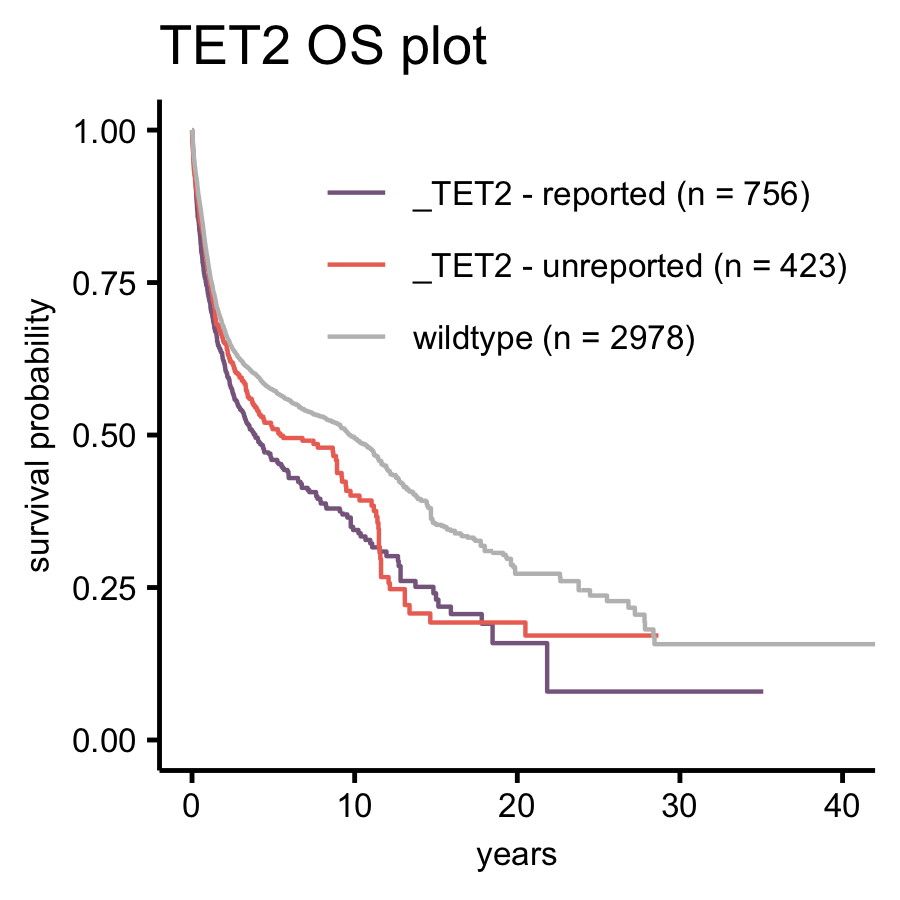

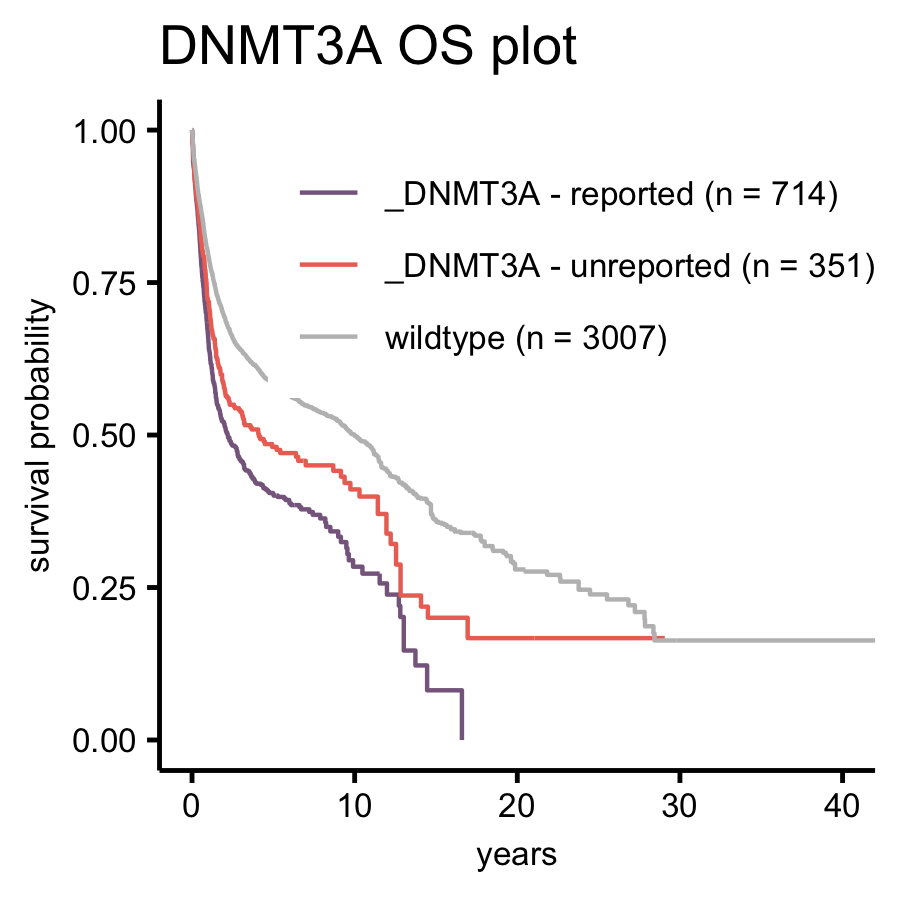

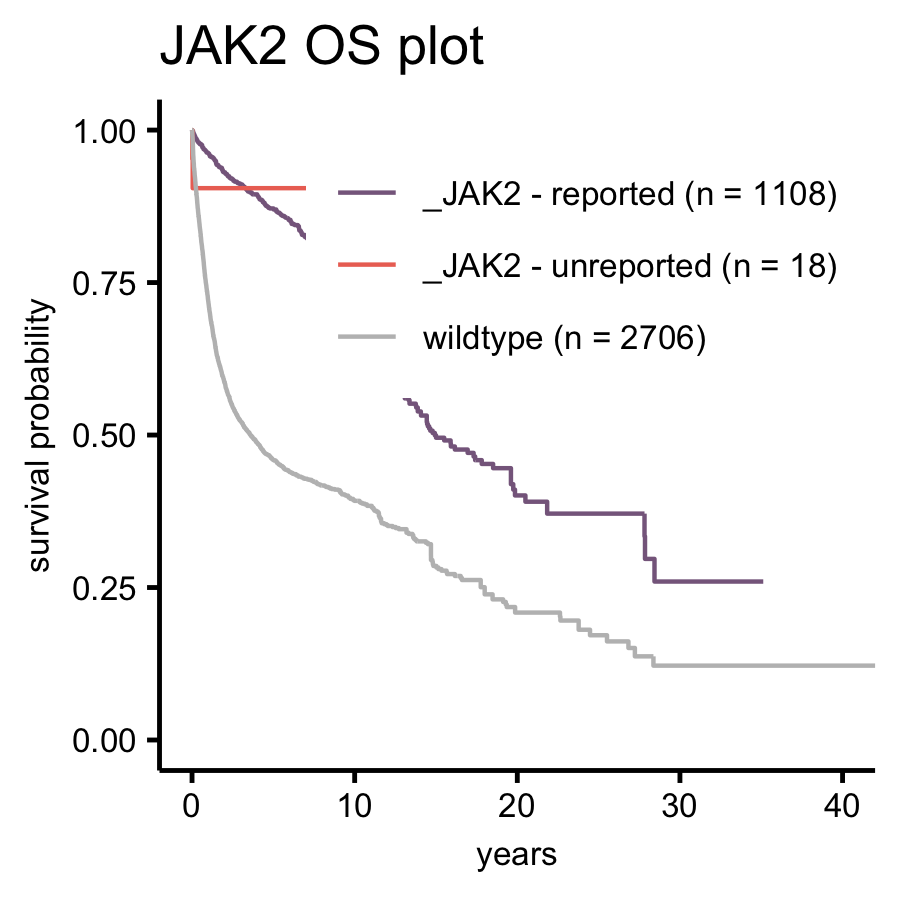

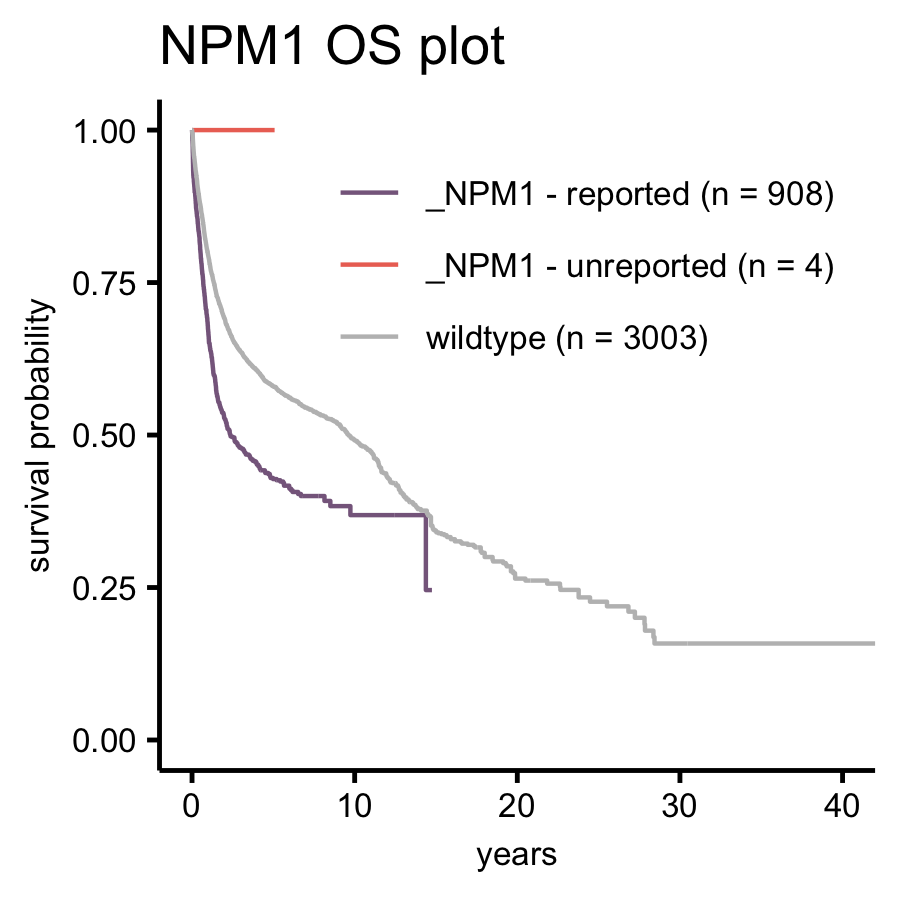

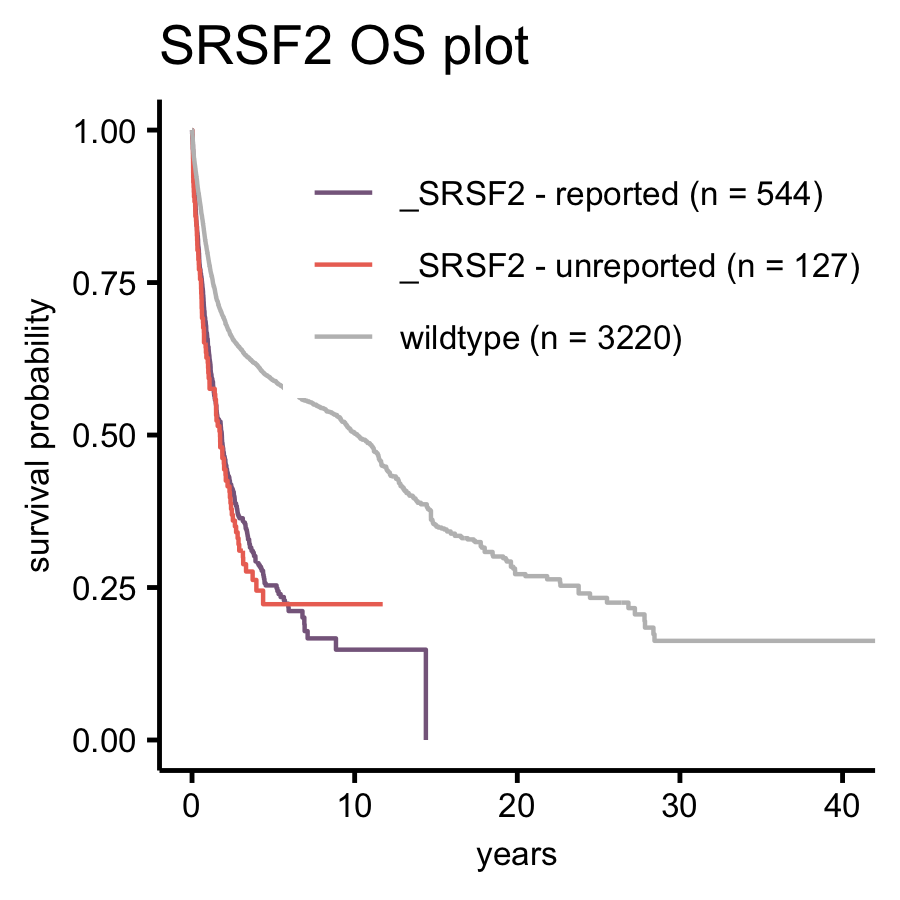

...

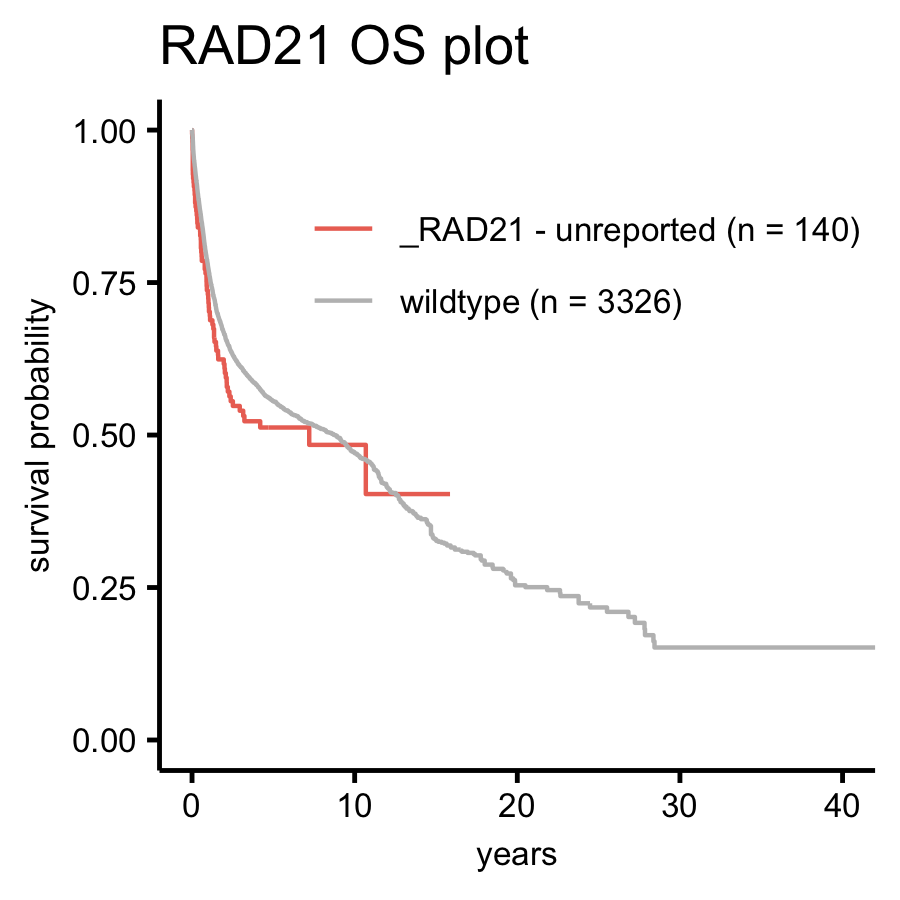

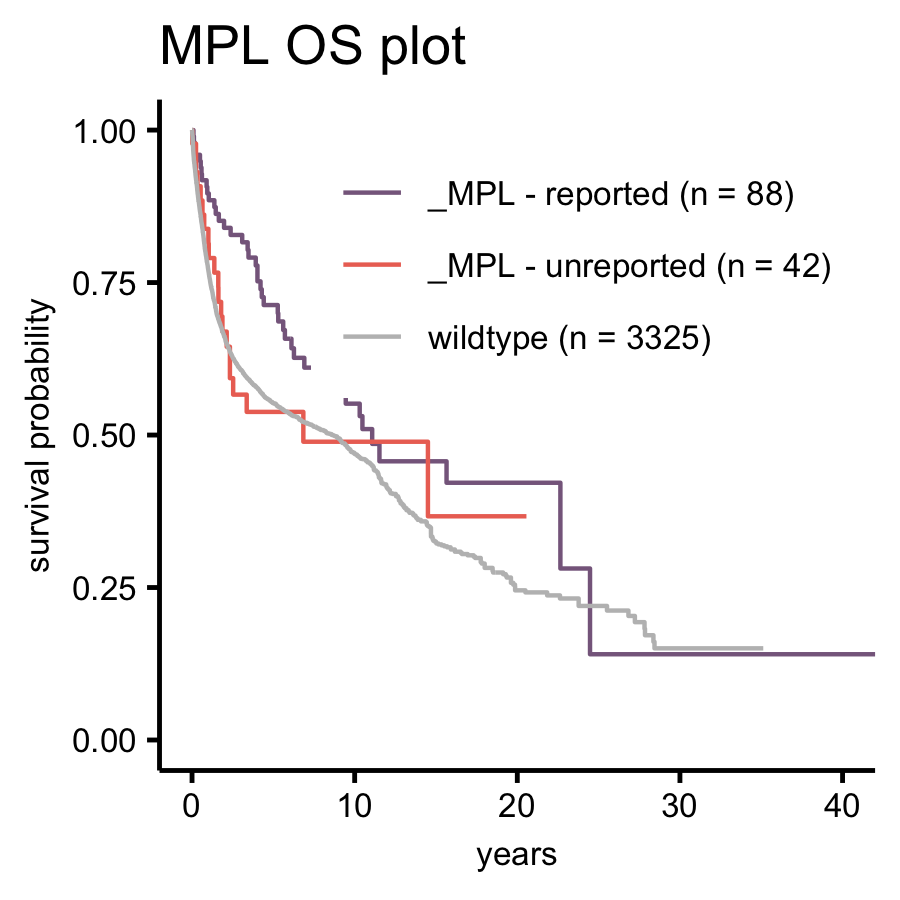

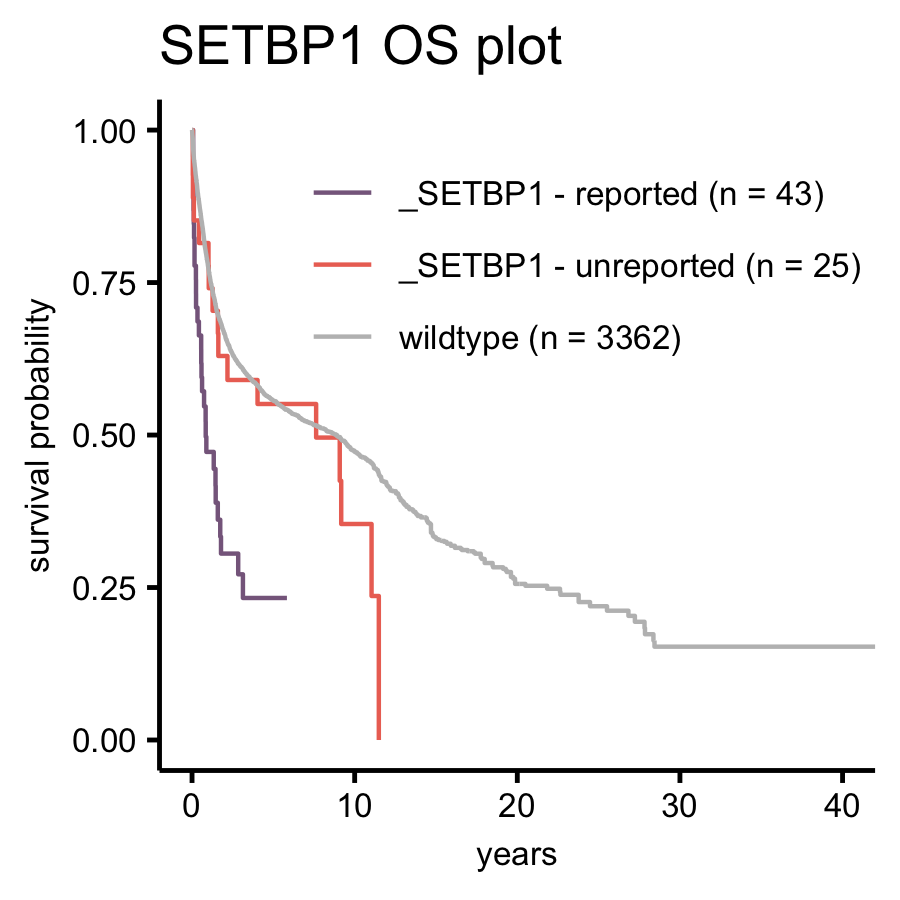

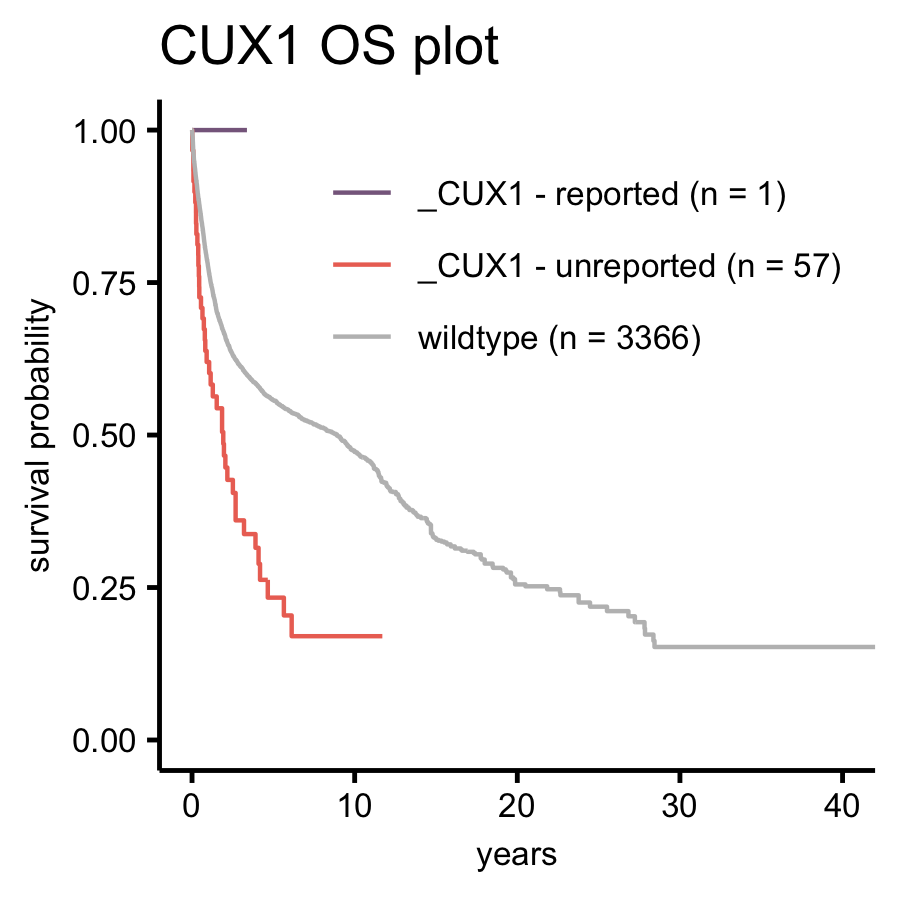

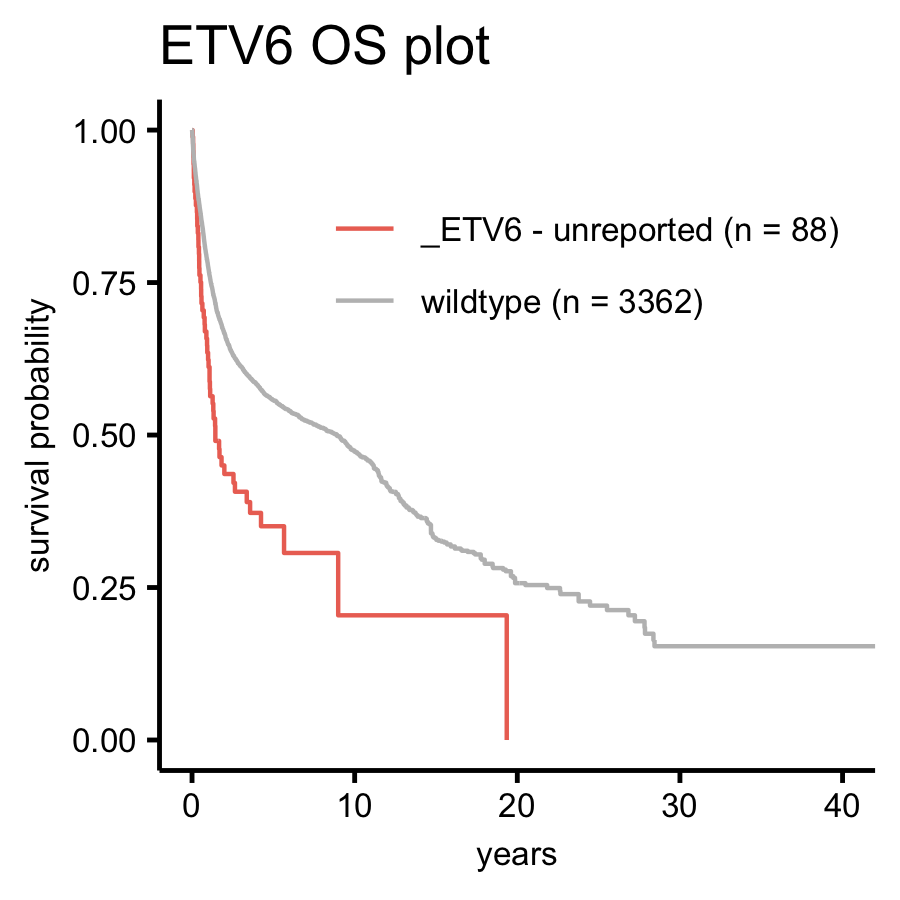

In [13]:
set_notebook_plot_size(3, 3)

for (gene in head(get_table(data['Gene']), 33)$values) {
    # create stratifier column for gene
    temp <- add_gene_data(gene)
    
    # handle colors
    colors <- c()
    if ('reported' %in% temp$status)
        colors <- c('#87688C')
    if ('unreported' %in% temp$status)
        colors <- c(colors, '#EC7263')
    
    # plot OS
    plt <- plot_survival_curve_stratified_by_categorical_feature(temp,
                                                                 mask                   = (temp$has_gene == TRUE),
                                                                 wildtype_mask          = (temp$has_gene == FALSE),
                                                                 stratifier_column_name = 'status',
                                                                 legend_prefix          = sprintf('_%s - ', gene),
                                                                 colors                 = c(colors, 'grey'),
                                                                 remove_na              = FALSE) +
               ggtitle(sprintf('%s OS plot', gene)) +
               theme(plot.title = element_text(size = 13))
    
    print(plt)
    
    # save plot
    ggsave(sprintf('report/OS_plots/OS_%s.png', gene), width = 3, height = 3)
}

## Detailed OS plots

In [33]:
# add special status column for a gene to perform OS plot stratification later
add_gene_data <- function(gene) {
    dd <- data %>%
              group_by(ID) %>%
              summarise(has_gene             = (gene %in% Gene),
                        no_mutation_reported = (sum((Gene == gene) & (status_short == 'reported')) == 0),
                        no_truncating        = (sum((Gene == gene) & (short_consequence %in% c('truncating', 'nonsense/splicing', 'inframe'))) == 0))
        
    dd$status <- sprintf('no_%s_mutation', gene)
    dd$status[dd$has_gene & dd$no_mutation_reported & dd$no_truncating]  <- 'unreported missense/other only'
    dd$status[dd$has_gene & dd$no_mutation_reported & !dd$no_truncating] <- 'unreported trunc./nons./splice/infr.'
    dd$status[dd$has_gene & !dd$no_mutation_reported] <- 'reported'
    
    return (merge(clinical_data, dd, by = 'ID'))
}

get_table(add_gene_data('STAG2')$status)

values,count,freq
no_STAG2_mutation,8460,94.4%
unreported trunc./nons./splice/infr.,379,4.2%
reported,75,0.8%
unreported missense/other only,52,0.6%
-- total --,8966,100%


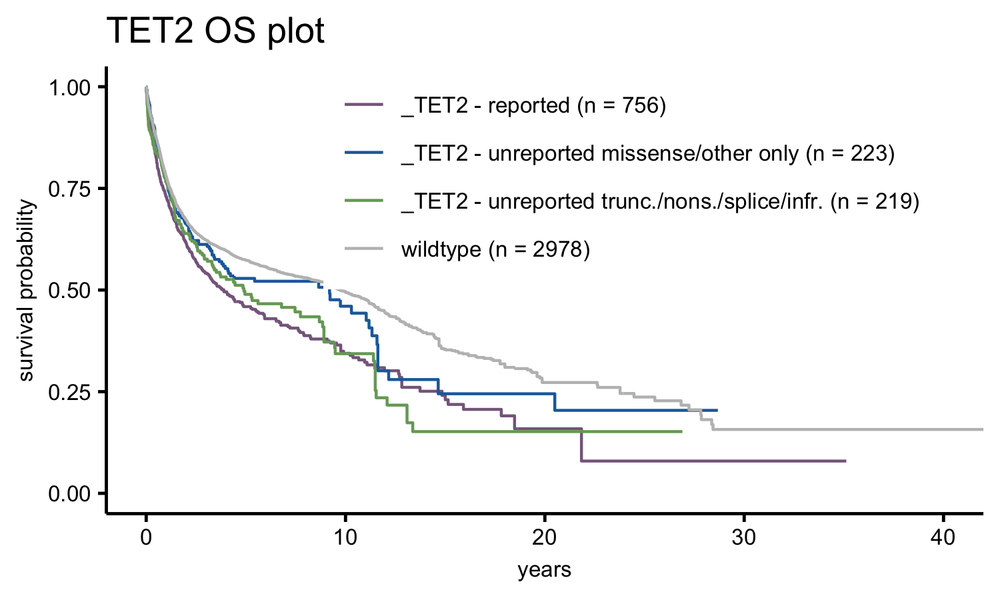

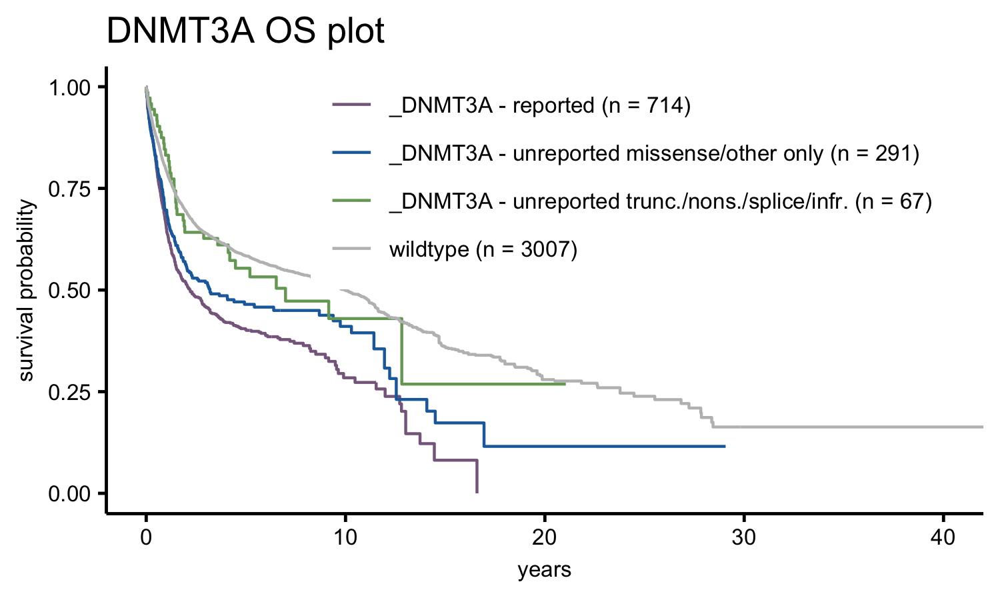

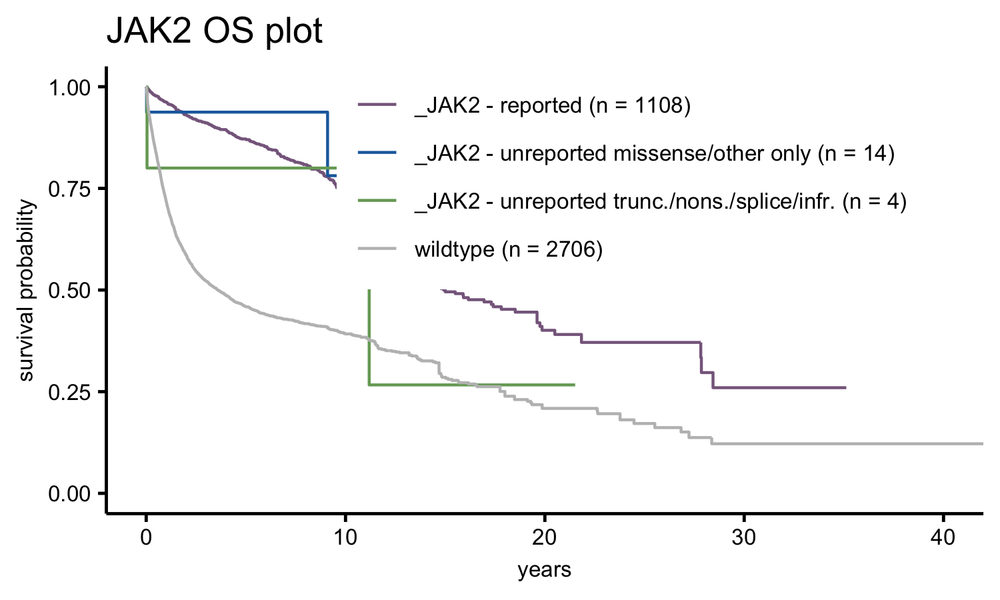

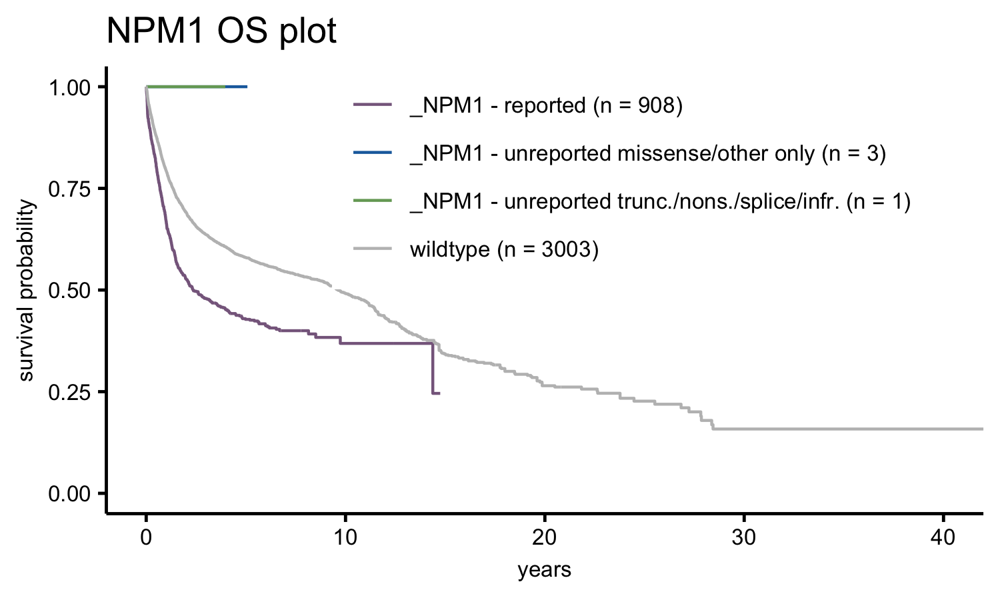

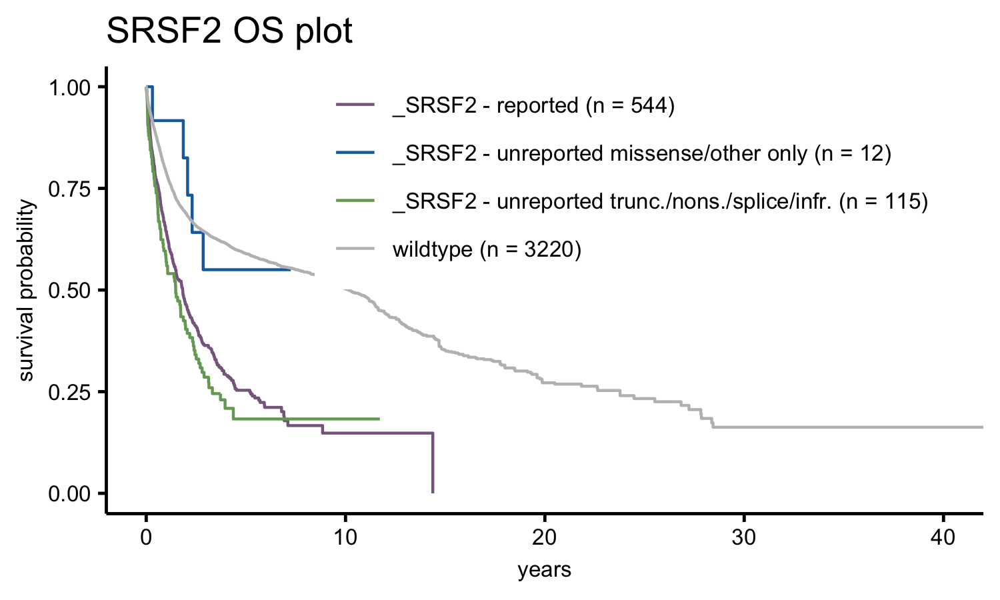

...

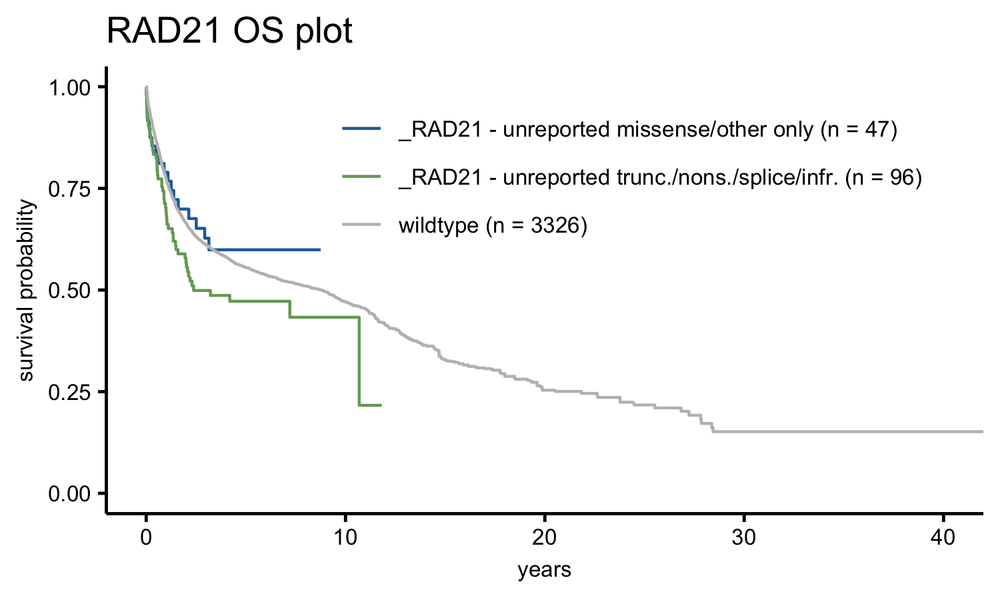

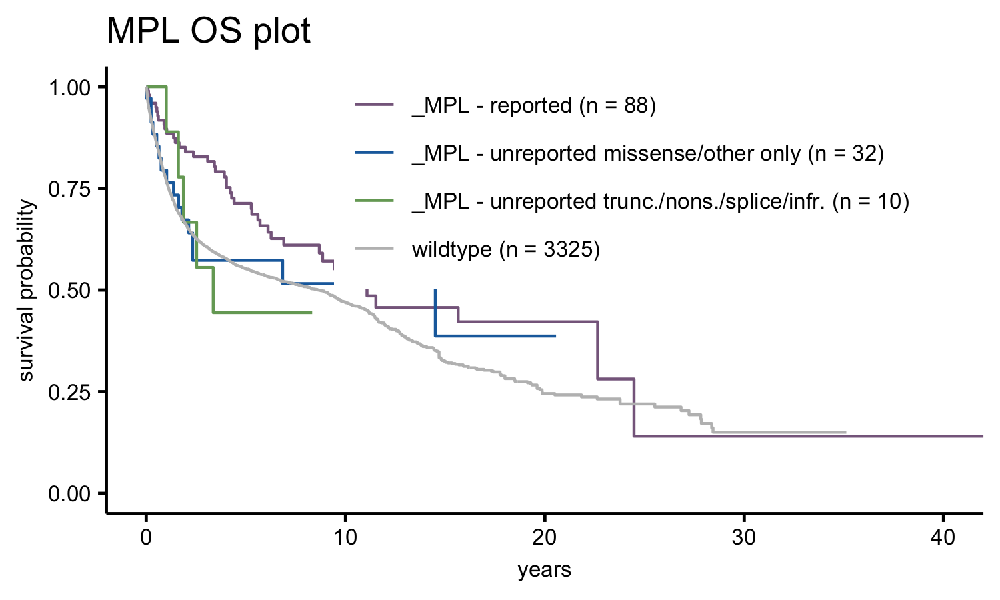

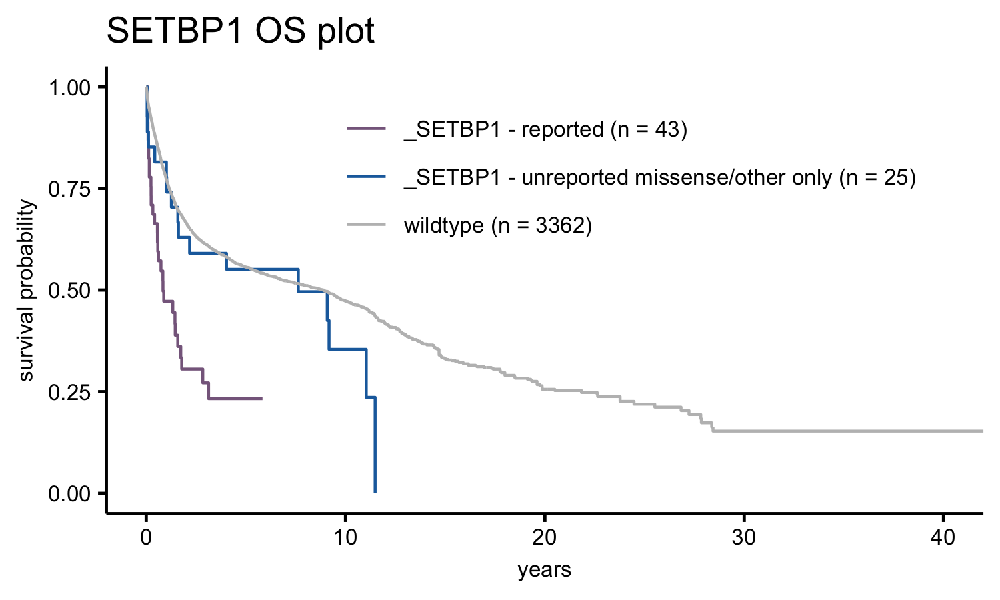

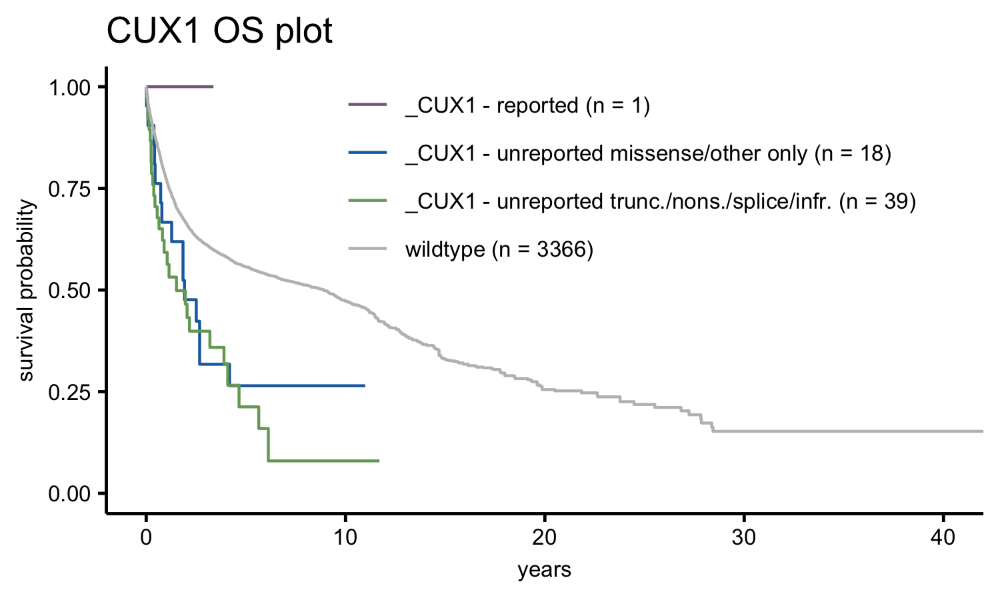

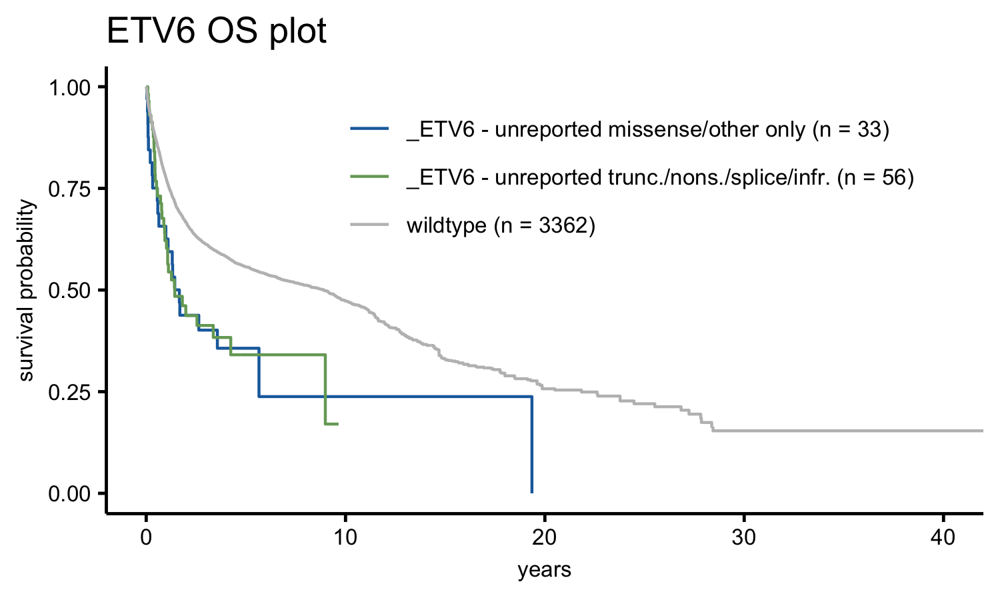

In [34]:
set_notebook_plot_size(5, 3)

for (gene in head(get_table(data['Gene']), 33)$values) {
    # create stratifier column for gene
    temp <- add_gene_data(gene)
    
    # handle colors
    colors <- c()
    if ('reported' %in% temp$status)
        colors <- c('#87688C')
    if ('unreported missense/other only' %in% temp$status)
        colors <- c(colors, '#1C6CAB')
    if ('unreported trunc./nons./splice/infr.' %in% temp$status)
        colors <- c(colors, '#76A665')
    
    # plot OS
    plt <- plot_survival_curve_stratified_by_categorical_feature(temp,
                                                                 mask                   = (temp$has_gene == TRUE),
                                                                 wildtype_mask          = (temp$has_gene == FALSE),
                                                                 stratifier_column_name = 'status',
                                                                 legend_prefix          = sprintf('_%s - ', gene),
                                                                 colors                 = c(colors, 'grey'),
                                                                 remove_na              = FALSE) +
               ggtitle(sprintf('%s OS plot', gene)) +
               theme(plot.title = element_text(size = 13))
    
    print(plt)
    
    # save plot
    ggsave(sprintf('report/OS_plots_detailed/OS_%s.png', gene), width = 5, height = 3)
}